# Project description

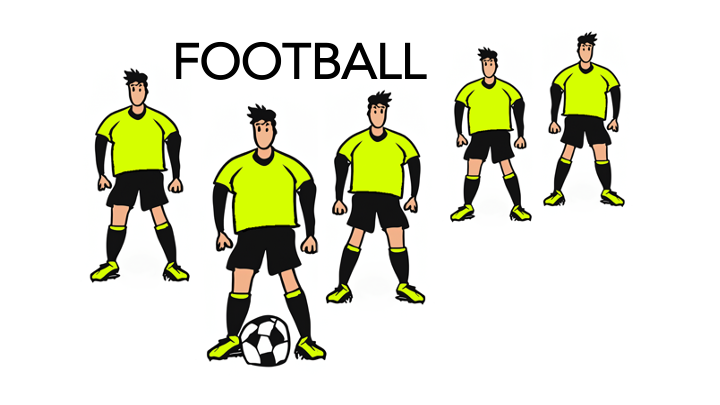

This is a Turing College Module 2 capstone project. This project is related to "Ultimate 25k+ Matches Football Database" encompassing huge amount of information about football matches from 2008 to 2016. Dataset could be found on kaggle.com/datasets/prajitdatta/ultimate-25k-matches-football-database-european.

**BUSINESS PROBLEM:**
I am a data scientist working in a sports betting company. The business executives in my company after some initial analysis identified betting on soccer (European football) as an potential new business opportunity. The problem is that my company doesn't know a lot about soccer (European football). My manager asked me to analyze this dataset and see if I can provide anything that could give us a competitive advantage in the attempt to start strong in the new endeavor.

**APPROACH TO THE PROBLEM:**
Me and my colleagues were surprised by the huge number of parameters each player and each match has. This is why I have decided to do a thorough analysis of the metrics to build a strong foundation for possible betting predictions. As the project got bigger and bigger, I have limited the amount of predictions and finetuning of models because the notebook became too laggy and time-consuming to run/work with.

**STEP BY STEP SOLUTION:**

- Extract and analyze data in the tables. Understand what each of the metrics mean, whether they are numerical or categorical, how are they distributed, who are the sportsmen historically demonstrating highest metrics. Account for the features that are correlated and would allow dimensionality reduction or the simplification of the analysis in general.

- Answer to particular questions me and my colleagues had initially:
    
    
    - Are players playing as best as they can (at full potential)?
    - Which metrics of players do correlate?
    - What are the physical parameters of players, like height, weight, BMI and age; and do they correlate with performance? Are they a useful metric for prediction?
    - What is the most popular first and last names among football players?
    - Is there such a thing as Relative Age Effect (RAE)?
    - Which leagues are in which countries?
    - Which leagues score the most/fewest goals?
    - Is there such a thing as home advantage?
    - Which country hosted the most matches?
    - What is the most popular word in names of the teams?
    - Are there teams' attributes that correlate with each other?
    - Who are the top scorers in each league?

    
- Try to predict, evaluate the performance of models and build a strategy for future work: 
    - Can we predict how many goals each team will score in each match?
    - Can we predict which team will win the match?
    - Suggest how to improve predictions to successfully enter the betting game.

# Data preparation

In [1]:
# Database
import sqlite3

# Numerical
import pandas as pd
import numpy as np

# Graphs and style
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm

# Map
import plotly.express as px
import pycountry

# Date and time
import calendar
from datetime import datetime as dt

# Wordcloud
from wordcloud import WordCloud

# Statistics
from scipy.stats import f_oneway
from scipy import stats

# Regex
import re

# File handling
import zipfile
import glob

# ML
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report

# XML
import xml.etree.ElementTree as ET


# Import external extension to beautify the code using "Black"
%load_ext nb_black

sns.set_style("whitegrid")

# Set the maximum number of columns to be displayed to a large number
# pd.set_option("display.max_columns", None)
# pd.set_option("display.max_rows", None)

<IPython.core.display.Javascript object>

In [2]:
# This code to download dataset directly from kaggle.com using Kaggle API

# Download dataset from Kaggle
!kaggle datasets download -d prajitdatta/ultimate-25k-matches-football-database-european

# Get the name of the downloaded zip file, parameter [0] is set as only one .zip file should be present,
# thus the first one should be selected
zip_file = glob.glob("*.zip")[0]

# Unzip database
with zipfile.ZipFile(zip_file, "r") as zip_ref:
    zip_ref.extractall(".")

# Refer to database file as "football_db"
football_db = glob.glob("*.sqlite")[0]

 98%|█████████████████████████████████████▏| 32.0M/32.7M [00:03<00:00, 11.1MB/s]
100%|██████████████████████████████████████| 32.7M/32.7M [00:03<00:00, 9.25MB/s]


<IPython.core.display.Javascript object>

In [3]:
# Uncomment and use this code if dataset is already present in the system
# football_db = "/Users/drkazimieras/Turing College/Football/football_database.sqlite"

<IPython.core.display.Javascript object>

# Custom functions

In [4]:
# This function provides important statistical insigthts from the table that is passed to it


def basic_table_analysis(database_name, table_name):
    with sqlite3.connect(database_name) as conn:
        df = pd.read_sql_query(f"SELECT * FROM {table_name}", conn)

    # Count number of rows and features 
    total_rows = len(df)
    total_features = len(df.columns)

    # Check for identical row to another row
    duplicate_rows = df.duplicated().sum()

    print(f"Total number of rows in {table_name}: {total_rows}")
    print(f"Number of duplicate rows: {duplicate_rows}\n\n")
    print(f"Total number of features in {table_name}: {total_features}")

    # NaN values in each column and percentage
    missing_values = df.isnull().sum()
    missing_values_percentage = round(df.isnull().mean() * 100, 2)

    # Type of data for each feature/each column
    data_types = df.dtypes

    # Min, max values
    numerical_columns = df.select_dtypes(include=[np.number]).columns
    min_values = df[numerical_columns].min()
    min_values = min_values.reindex(
        df.columns
    )  
    max_values = df[numerical_columns].max()
    max_values = max_values.reindex(df.columns)

    # create new df with info
    info_df = pd.DataFrame(
        {
            "Feature name": df.columns,
            "Data type": data_types.values,
            "Missing values (count)": missing_values.values,
            "Missing values (%)": missing_values_percentage.values,
            "Min value": min_values,
            "Max value": max_values,
        }
    )

    return info_df

<IPython.core.display.Javascript object>

In [5]:
# This function returns the names of the features from the table that is passed to it


def names_features(database_name, table_name):
    with sqlite3.connect(database_name) as conn:
        cur = conn.cursor()

        # PRAGMA
        cur.execute(f"PRAGMA table_info({table_name});")
        columns_info = cur.fetchall()

    # create a touple, indexed
    column_names = [column[1] for column in columns_info]
    column_names_str = ", ".join(column_names)

    print(f"Names of features in {table_name} table are:\n\n{column_names_str}.")

<IPython.core.display.Javascript object>

In [6]:
# This function returns histogram of selected numerical attribute together with some additional info


def player_attr_num_hist(feature_name, table_name, database_path, y_limit=10000):
    sns.set(style="whitegrid")

    with sqlite3.connect(database_path) as conn:
        # Load data from the specified table into a DF
        df = pd.read_sql_query(
            f"SELECT {table_name}.{feature_name}, Player.player_name FROM {table_name} JOIN Player ON {table_name}.player_api_id = Player.player_api_id",
            conn,
        )

    # Remove NaN values
    df = df.dropna()

    # Define the bin width, based on the range of the feature
    bin_width = (df[feature_name].max() - df[feature_name].min()) / 40

    # Create a histogram for the feature
    plot = sns.histplot(
        df[feature_name],
        kde=False,
        color="mediumseagreen",
        alpha=0.8,
        binwidth=bin_width,
    )

    # Set the y locations and labels
    plot.set_yticks(plot.get_yticks())
    ylabels = ["{:,.0f}".format(y) for y in plot.get_yticks() / 1000]
    plot.set_yticklabels(ylabels)

    # Adjust y axis limit
    # plt.ylim(0, y_limit)

    # Adjust feature name
    feature_name_adjusted = feature_name.replace("_", " ").capitalize()

    # Label the axes and give the plot a title
    plt.xlabel(feature_name_adjusted)
    plt.ylabel("Counts (in 1000)")
    plt.title(f"Distribution of {feature_name_adjusted}")

    # Adjust x-axis limit
    plt.xlim(df[feature_name].min(), df[feature_name].max())

    plt.show()
    mean_value = df[feature_name].mean()
    print(f"The mean value of {feature_name_adjusted} is: {mean_value:.2f}")
    std_dev = df[feature_name].std()
    print(f"The standard deviation of {feature_name_adjusted} is: {std_dev:.2f}")

    # List top performers
    df_grouped = df.groupby("player_name")[feature_name].max().reset_index()
    top_performers = df_grouped.nlargest(3, feature_name)

    print("\n")
    print(
        f"The TOP 3 distinct performers in the category of {feature_name_adjusted} are:"
    )
    for i in range(3):
        print(
            f"{i+1}. {top_performers['player_name'].iloc[i]} with {feature_name_adjusted} of {top_performers[feature_name].iloc[i]}"
        )

<IPython.core.display.Javascript object>

In [7]:
# This function returns bar chart of selected cathegorical attribute


def player_attr_cat_dist(column_name):
    with sqlite3.connect(football_db) as conn:
        df = pd.read_sql_query(f"SELECT * FROM player_attributes", conn)

    # Rename
    df.columns = [
        col.replace("_", " ").capitalize()
        if not col.startswith("gk_")
        else "GK " + col[3:].replace("_", " ").capitalize()
        for col in df.columns
    ]

    # if column_name exists in DF after renaming?
    column_name_formatted = column_name.replace("_", " ").capitalize()
    if column_name_formatted not in df.columns:
        print(f"Column '{column_name_formatted}' not found in DataFrame.")
        return

    # Define the list of accepted categories
    accepted_categories = ["left", "right", "medium", "high", "low"]

    # Put some features to 'Other'
    df[column_name_formatted] = np.where(
        df[column_name_formatted].isin(accepted_categories),
        df[column_name_formatted],
        "Other",
    )

    ax = sns.countplot(x=column_name_formatted, data=df, palette="Greens", alpha=0.9)
    ax.set_xlabel(column_name_formatted)
    ax.set_ylabel("Count (in 10 000)")

    yticks = ax.get_yticks()
    ax.yaxis.set_major_locator(plt.FixedLocator(yticks))
    ylabels = ["{:.0f}".format(y) for y in yticks / 10000]
    ax.set_yticklabels(ylabels)

    xlabels = [label.get_text().capitalize() for label in ax.get_xticklabels()]
    ax.set_xticklabels(xlabels, rotation=0)

    plt.title(f"Distribution of {column_name_formatted}")

    plt.show()

<IPython.core.display.Javascript object>

In [8]:
# This function returns unique values of the selected feature


def unique_values_feature(database_name, table_name, feature_name):
    with sqlite3.connect(database_name) as conn:
        df = pd.read_sql_query(f"SELECT {feature_name} FROM {table_name}", conn)

    if feature_name not in df.columns:
        print(f"Feature '{feature_name}' not found in {table_name} table.")
        return

    unique_values = df[feature_name].unique()
    unique_values_str = ", ".join([str(value) for value in unique_values])

    print(
        f"Unique values of '{feature_name}' in {table_name} table:\n{unique_values_str}"
    )

<IPython.core.display.Javascript object>

In [9]:
# Insert space before capital letters in a passed string (regex, for Teams Attributes)


def split_before_caps(s):
    return re.sub(r"(?<=[a-z])(?=[A-Z])", " ", s)

<IPython.core.display.Javascript object>

In [10]:
def plot_teams_attr_both(football_db, table, num_var, cat_var):
    with sqlite3.connect(football_db) as conn:
        df = pd.read_sql_query(f"SELECT {num_var}, {cat_var} FROM {table}", conn)

    fig, axs = plt.subplots(2, figsize=(10, 10))

    num_var_title = split_before_caps(num_var).capitalize()
    cat_var_title = split_before_caps(cat_var).capitalize()

    sns.histplot(data=df, x=num_var, kde=False, ax=axs[0], color="turquoise", alpha=0.8)
    axs[0].set_title(f"Histogram of {num_var_title}")
    axs[0].set_xlabel(num_var_title)
    axs[0].set_ylabel("Counts")

    sns.countplot(data=df, x=cat_var, ax=axs[1], palette="Greens_d", alpha=0.8)
    axs[1].set_title(f"Bar chart of {cat_var_title}")
    axs[1].set_xlabel(cat_var_title)
    axs[1].set_ylabel("Counts")

    plt.tight_layout()

<IPython.core.display.Javascript object>

In [11]:
# These functions return histogram of Teams Attributes values
# It should be called if only "Class" (categorical variable) is present


def plot_teams_attr_bar(football_db, table, cat_var):
    with sqlite3.connect(football_db) as conn:
        df = pd.read_sql_query(f"SELECT {cat_var} FROM {table}", conn)

    cat_var_title = split_before_caps(cat_var).capitalize()

    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=cat_var, palette="Greens_d", alpha=0.8)
    plt.title(f"Bar chart of {cat_var_title}")
    plt.xlabel(cat_var_title)
    plt.ylabel("Counts")

    # plt.tight_layout()
    plt.show()

<IPython.core.display.Javascript object>

In [12]:
# WordCloud function


def names_for_wordcloud(list_of_names, stopwords):
    # List of names put into a string, with names separated by space
    text = " ".join(list_of_names)
    wordcloud = WordCloud(
        width=1000,
        height=500,
        collocations=False,
        stopwords=stopwords,
        background_color="white",
        colormap="viridis",
    ).generate(text)
    plt.figure(figsize=(15, 8))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

<IPython.core.display.Javascript object>

# Dataset overview

In [13]:
with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()

    # Execute query and get results
    cur.execute("SELECT name FROM sqlite_master WHERE type='table';")
    tables = cur.fetchall()

    # Print info about each table, display head of each table, and print count of rows
    for table in tables:
        print(f"Table name: {table[0]}")
        columns = cur.fetchall()
        for column in columns:
            print(column)

        cur.execute(f"SELECT COUNT(*) from {table[0]};")
        count = cur.fetchone()[0]
        print(f"Data rows in table: {count}")

        df = pd.read_sql_query(f"SELECT * from {table[0]} LIMIT 5;", conn)
        display(df)

Table name: sqlite_sequence
Data rows in table: 7


,name,seq
0,Team,103916
1,Country,51958
2,League,51958
3,Match,51958
4,Player,11075


Table name: Player_Attributes
Data rows in table: 183978


,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,1,218353,505942,2016-02-18 00:00:00,67,71,right,medium,medium,49,...,54,48,65,69,69,6,11,10,8,8
1,2,218353,505942,2015-11-19 00:00:00,67,71,right,medium,medium,49,...,54,48,65,69,69,6,11,10,8,8
2,3,218353,505942,2015-09-21 00:00:00,62,66,right,medium,medium,49,...,54,48,65,66,69,6,11,10,8,8
3,4,218353,505942,2015-03-20 00:00:00,61,65,right,medium,medium,48,...,53,47,62,63,66,5,10,9,7,7
4,5,218353,505942,2007-02-22 00:00:00,61,65,right,medium,medium,48,...,53,47,62,63,66,5,10,9,7,7


Table name: Player
Data rows in table: 11060


,id,player_api_id,player_name,player_fifa_api_id,birthday,height,weight
0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
1,2,155782,Aaron Cresswell,189615,1989-12-15 00:00:00,170.18,146
2,3,162549,Aaron Doran,186170,1991-05-13 00:00:00,170.18,163
3,4,30572,Aaron Galindo,140161,1982-05-08 00:00:00,182.88,198
4,5,23780,Aaron Hughes,17725,1979-11-08 00:00:00,182.88,154


Table name: Match
Data rows in table: 25979


,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,...,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA
0,1,1,1,2008/2009,1,2008-08-17 00:00:00,492473,9987,9993,1,...,4.00,1.65,3.40,4.50,1.78,3.25,4.00,1.73,3.40,4.20
1,2,1,1,2008/2009,1,2008-08-16 00:00:00,492474,10000,9994,0,...,3.80,2.00,3.25,3.25,1.85,3.25,3.75,1.91,3.25,3.60
2,3,1,1,2008/2009,1,2008-08-16 00:00:00,492475,9984,8635,0,...,2.50,2.35,3.25,2.65,2.50,3.20,2.50,2.30,3.20,2.75
3,4,1,1,2008/2009,1,2008-08-17 00:00:00,492476,9991,9998,5,...,7.50,1.45,3.75,6.50,1.50,3.75,5.50,1.44,3.75,6.50
4,5,1,1,2008/2009,1,2008-08-16 00:00:00,492477,7947,9985,1,...,1.73,4.50,3.40,1.65,4.50,3.50,1.65,4.75,3.30,1.67


Table name: League
Data rows in table: 11


,id,country_id,name
0,1,1,Belgium Jupiler League
1,1729,1729,England Premier League
2,4769,4769,France Ligue 1
3,7809,7809,Germany 1. Bundesliga
4,10257,10257,Italy Serie A


Table name: Country
Data rows in table: 11


,id,name
0,1,Belgium
1,1729,England
2,4769,France
3,7809,Germany
4,10257,Italy


Table name: Team
Data rows in table: 299


,id,team_api_id,team_fifa_api_id,team_long_name,team_short_name
0,1,9987,673,KRC Genk,GEN
1,2,9993,675,Beerschot AC,BAC
2,3,10000,15005,SV Zulte-Waregem,ZUL
3,4,9994,2007,Sporting Lokeren,LOK
4,5,9984,1750,KSV Cercle Brugge,CEB


Table name: Team_Attributes
Data rows in table: 1458


,id,team_fifa_api_id,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,1,434,9930,2010-02-22 00:00:00,60,Balanced,NaN,Little,50,Mixed,...,55,Normal,Organised,50,Medium,55,Press,45,Normal,Cover
1,2,434,9930,2014-09-19 00:00:00,52,Balanced,48.0,Normal,56,Mixed,...,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
2,3,434,9930,2015-09-10 00:00:00,47,Balanced,41.0,Normal,54,Mixed,...,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
3,4,77,8485,2010-02-22 00:00:00,70,Fast,NaN,Little,70,Long,...,70,Lots,Organised,60,Medium,70,Double,70,Wide,Cover
4,5,77,8485,2011-02-22 00:00:00,47,Balanced,NaN,Little,52,Mixed,...,52,Normal,Organised,47,Medium,47,Press,52,Normal,Cover


<IPython.core.display.Javascript object>

There are 8 tables in this dataset:
- `sqlite_sequence`
- `Player_Attributes`
- `Player`
- `Match`
- `League`
- `Country`
- `Team`
- `Team_Attributes`

# Players attributes

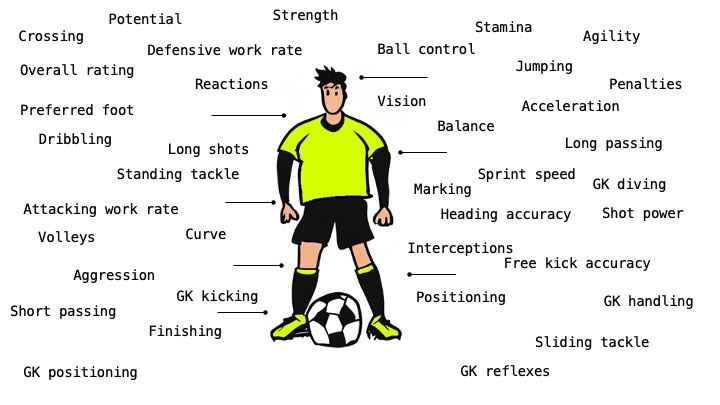

In [14]:
analysis_play_attr = basic_table_analysis(football_db, "Player_Attributes")

Total number of rows in Player_Attributes: 183978
Number of duplicate rows: 0


Total number of features in Player_Attributes: 42


<IPython.core.display.Javascript object>

In [15]:
# Display all the columns
pd.set_option("display.max_columns", None)

with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'Player_Attributes' LIMIT 5;", conn)
    display(df)

# Reset display of columns to default
pd.set_option("display.max_columns", 10)

,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,free_kick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,1,218353,505942,2016-02-18 00:00:00,67,71,right,medium,medium,49,44,71,61,44,51,45,39,64,49,60,64,59,47,65,55,58,54,76,35,71,70,45,54,48,65,69,69,6,11,10,8,8
1,2,218353,505942,2015-11-19 00:00:00,67,71,right,medium,medium,49,44,71,61,44,51,45,39,64,49,60,64,59,47,65,55,58,54,76,35,71,70,45,54,48,65,69,69,6,11,10,8,8
2,3,218353,505942,2015-09-21 00:00:00,62,66,right,medium,medium,49,44,71,61,44,51,45,39,64,49,60,64,59,47,65,55,58,54,76,35,63,41,45,54,48,65,66,69,6,11,10,8,8
3,4,218353,505942,2015-03-20 00:00:00,61,65,right,medium,medium,48,43,70,60,43,50,44,38,63,48,60,64,59,46,65,54,58,54,76,34,62,40,44,53,47,62,63,66,5,10,9,7,7
4,5,218353,505942,2007-02-22 00:00:00,61,65,right,medium,medium,48,43,70,60,43,50,44,38,63,48,60,64,59,46,65,54,58,54,76,34,62,40,44,53,47,62,63,66,5,10,9,7,7


<IPython.core.display.Javascript object>

In [16]:
names_features(football_db, "Player_Attributes")

Names of features in Player_Attributes table are:

id, player_fifa_api_id, player_api_id, date, overall_rating, potential, preferred_foot, attacking_work_rate, defensive_work_rate, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, free_kick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, marking, standing_tackle, sliding_tackle, gk_diving, gk_handling, gk_kicking, gk_positioning, gk_reflexes.


<IPython.core.display.Javascript object>

## Overview of numerical Players attributes

There are 34 numerical attributes

### Overall rating

An overall assessment of the player's ability, typically out of 100. Higher values represent better players.

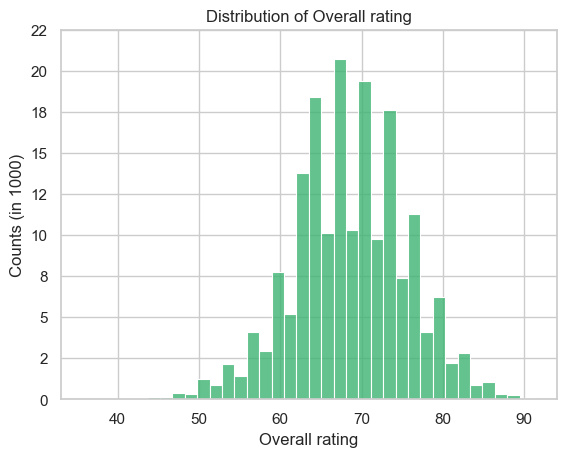

The mean value of Overall rating is: 68.60
The standard deviation of Overall rating is: 7.04


The TOP 3 distinct performers in the category of Overall rating are:
1. Lionel Messi with Overall rating of 94.0
2. Cristiano Ronaldo with Overall rating of 93.0
3. Gianluigi Buffon with Overall rating of 93.0


<IPython.core.display.Javascript object>

In [17]:
player_attr_num_hist("overall_rating", "Player_Attributes", football_db)

### Potential

A prediction of the highest overall rating a player could achieve, given their age, current ability, and potential growth.

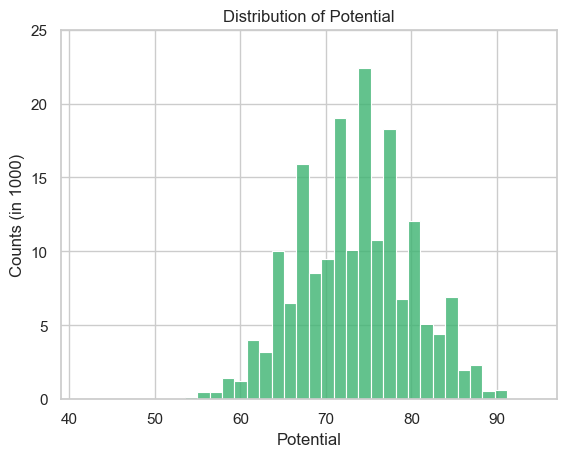

The mean value of Potential is: 73.46
The standard deviation of Potential is: 6.59


The TOP 3 distinct performers in the category of Potential are:
1. Lionel Messi with Potential of 97.0
2. Cristiano Ronaldo with Potential of 95.0
3. Ronaldinho with Potential of 95.0


<IPython.core.display.Javascript object>

In [18]:
player_attr_num_hist("potential", "Player_Attributes", football_db)

### Overall rating vs potential 

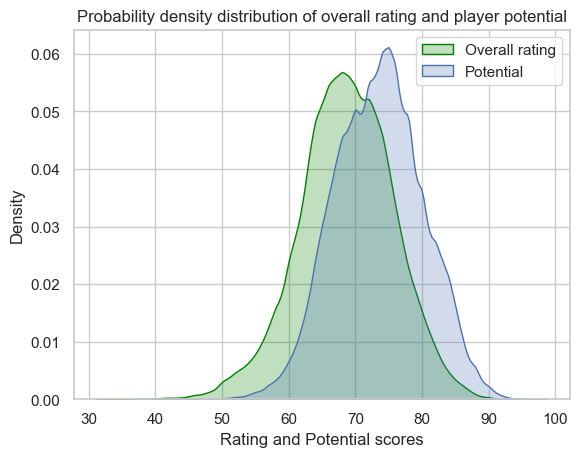

Percentage of players who exceeded their potential: 0.6%
Average difference in percentage between overall rating and potential: 6.5%


<IPython.core.display.Javascript object>

In [19]:
with sqlite3.connect(football_db) as conn:
    attributes = pd.read_sql_query(
        "SELECT overall_rating, potential FROM Player_Attributes", conn
    )

# Drop the rows with missing values
attributes.dropna(inplace=True)

# Calculate the difference in percentage between overall_rating and potential
attributes['diff_percent'] = ((attributes['potential'] - attributes['overall_rating']) / attributes['potential']) * 100

# Export to CSV for Google Looker studio (if necessary)
# attributes.to_csv("rating_vs_potential.csv", index=False)

# Plot the KDE of overall_rating and potential
sns.kdeplot(attributes['overall_rating'], fill=True, label="Overall rating", color='green')
sns.kdeplot(attributes['potential'], fill=True, label="Potential")
plt.title('Probability density distribution of overall rating and player potential')
plt.xlabel('Rating and Potential scores')
plt.legend()
plt.show()

# percentage of players who exceeded their potential
exceeded_potential = (attributes['overall_rating'] > attributes['potential']).mean()
print(f'Percentage of players who exceeded their potential: {exceeded_potential * 100:.1f}%')

# Average difference in percentage between overall_rating and potential
avg_diff_percent = attributes['diff_percent'].mean()
print(f'Average difference in percentage between overall rating and potential: {avg_diff_percent:.1f}%')


Potential score distribution is shifted to the higher scores by around 6% meaning that an average player has the potential to play 6% better than it currently does. Another important observation here is that around only around 0.6% of the players currently exceed their potential, thus expectations.

In [20]:
# Data export to csv for Google data studio
database_name = football_db
with sqlite3.connect(database_name) as conn:
    overall_rating_df = pd.read_sql_query(
        """
        SELECT overall_rating 
        FROM Player_Attributes
        """,
        conn,
    )
    
overall_rating_df.to_csv("overall_rating.csv", index=False)

<IPython.core.display.Javascript object>

### Crossing

A rating of the player's ability to cross the ball into the penalty area.

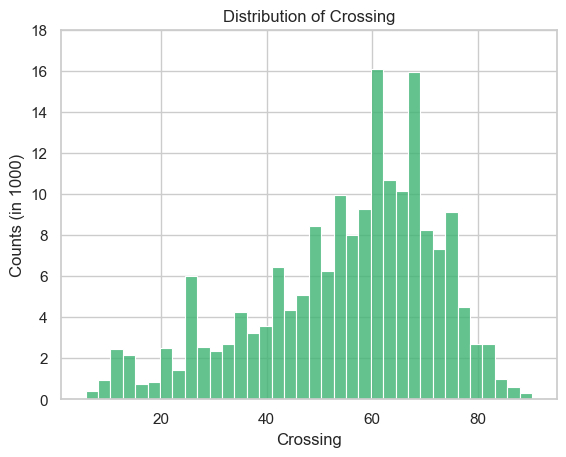

The mean value of Crossing is: 55.09
The standard deviation of Crossing is: 17.24


The TOP 3 distinct performers in the category of Crossing are:
1. David Beckham with Crossing of 95.0
2. Jerome Rothen with Crossing of 95.0
3. Morten Gamst Pedersen with Crossing of 95.0


<IPython.core.display.Javascript object>

In [21]:
player_attr_num_hist("crossing", "Player_Attributes", football_db)

### Finishing

A rating of the player's ability to score goals when close to the goal.

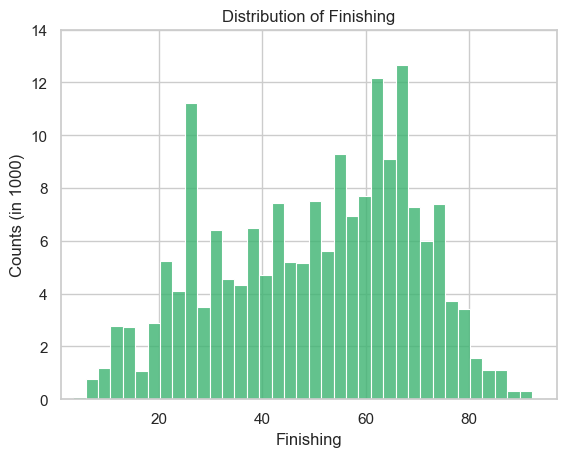

The mean value of Finishing is: 49.92
The standard deviation of Finishing is: 19.04


The TOP 3 distinct performers in the category of Finishing are:
1. Lionel Messi with Finishing of 97.0
2. Nikola Zigic with Finishing of 97.0
3. Luca Toni with Finishing of 96.0


<IPython.core.display.Javascript object>

In [22]:
player_attr_num_hist("finishing", "Player_Attributes", football_db)

### Head accuracy

A rating of the player's ability to direct the ball with their head.

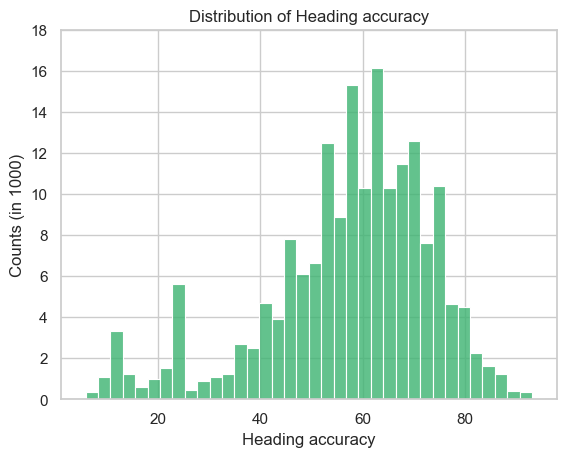

The mean value of Heading accuracy is: 57.27
The standard deviation of Heading accuracy is: 16.49


The TOP 3 distinct performers in the category of Heading accuracy are:
1. Nikola Zigic with Heading accuracy of 98.0
2. Aritz Aduriz with Heading accuracy of 95.0
3. Didier Drogba with Heading accuracy of 95.0


<IPython.core.display.Javascript object>

In [23]:
player_attr_num_hist("heading_accuracy", "Player_Attributes", football_db)

### Short passing

A rating of the player's ability to pass the ball accurately over short distances.

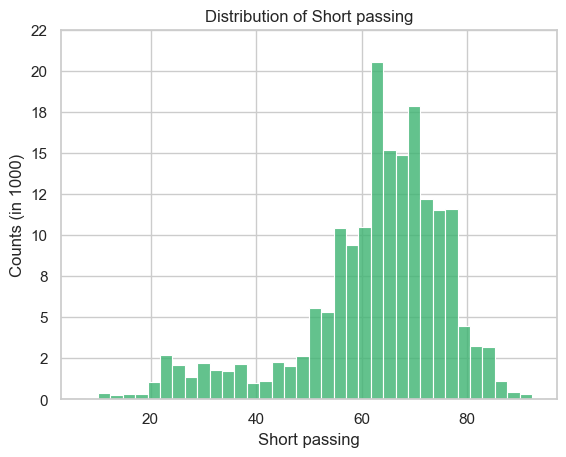

The mean value of Short passing is: 62.43
The standard deviation of Short passing is: 14.19


The TOP 3 distinct performers in the category of Short passing are:
1. Andrea Pirlo with Short passing of 97.0
2. Xavi Hernandez with Short passing of 97.0
3. Cesc Fabregas with Short passing of 96.0


<IPython.core.display.Javascript object>

In [24]:
player_attr_num_hist("short_passing", "Player_Attributes", football_db)

### Volleys

A rating of the player's ability to shoot at the goal by kicking a ball that is in the air.

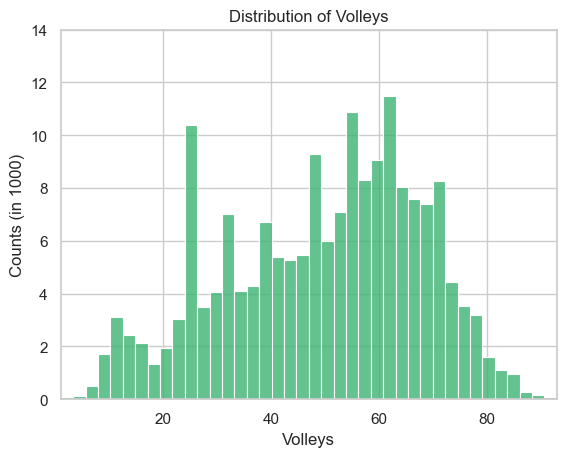

The mean value of Volleys is: 49.47
The standard deviation of Volleys is: 18.26


The TOP 3 distinct performers in the category of Volleys are:
1. Radamel Falcao with Volleys of 93.0
2. Robin van Persie with Volleys of 92.0
3. Zlatan Ibrahimovic with Volleys of 92.0


<IPython.core.display.Javascript object>

In [25]:
player_attr_num_hist("volleys", "Player_Attributes", football_db)

### Dribbling

A rating of the player's ability to move the ball along the ground with repeated short kicks.

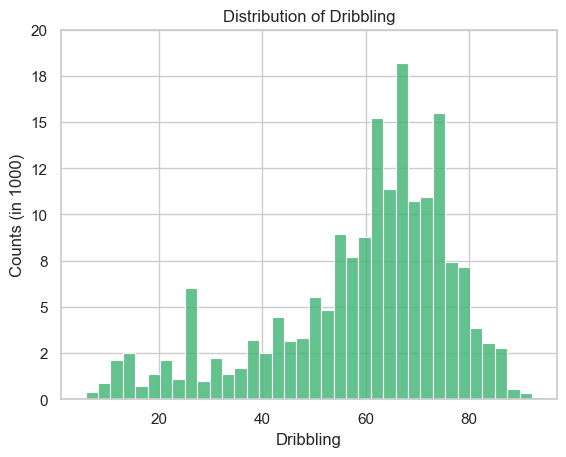

The mean value of Dribbling is: 59.18
The standard deviation of Dribbling is: 17.74


The TOP 3 distinct performers in the category of Dribbling are:
1. Cristiano Ronaldo with Dribbling of 97.0
2. Lionel Messi with Dribbling of 97.0
3. Ronaldinho with Dribbling of 97.0


<IPython.core.display.Javascript object>

In [26]:
player_attr_num_hist("dribbling", "Player_Attributes", football_db)

### Curve

A rating of the player's ability to curve the ball (bend it in mid-air).

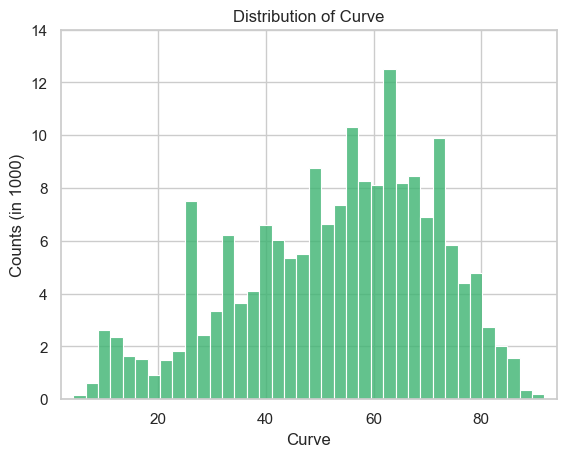

The mean value of Curve is: 52.97
The standard deviation of Curve is: 18.26


The TOP 3 distinct performers in the category of Curve are:
1. Andrea Pirlo with Curve of 94.0
2. David Beckham with Curve of 94.0
3. Hakan Calhanoglu with Curve of 93.0


<IPython.core.display.Javascript object>

In [27]:
player_attr_num_hist("curve", "Player_Attributes", football_db)

### Free kick accuracy

A rating of the player's accuracy when taking free kicks.

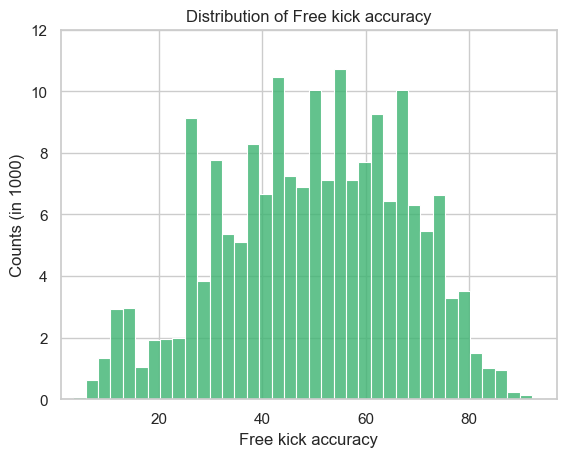

The mean value of Free kick accuracy is: 49.38
The standard deviation of Free kick accuracy is: 17.83


The TOP 3 distinct performers in the category of Free kick accuracy are:
1. Juninho Pernambucano,20 with Free kick accuracy of 97.0
2. Alessandro Del Piero with Free kick accuracy of 96.0
3. David Beckham with Free kick accuracy of 96.0


<IPython.core.display.Javascript object>

In [28]:
player_attr_num_hist("free_kick_accuracy", "Player_Attributes", football_db)

### Long passing

A rating of the player's ability to pass the ball accurately over long distances.

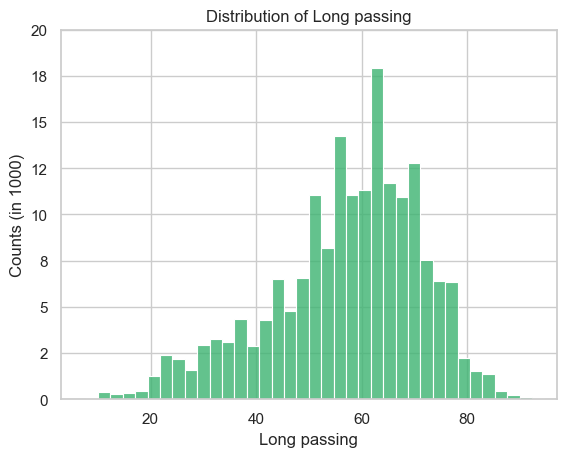

The mean value of Long passing is: 57.07
The standard deviation of Long passing is: 14.39


The TOP 3 distinct performers in the category of Long passing are:
1. Andrea Pirlo with Long passing of 97.0
2. Cesc Fabregas with Long passing of 95.0
3. David Beckham with Long passing of 95.0


<IPython.core.display.Javascript object>

In [29]:
player_attr_num_hist("long_passing", "Player_Attributes", football_db)

### Ball control

A rating of the player's ability to control the ball, particularly when receiving it.

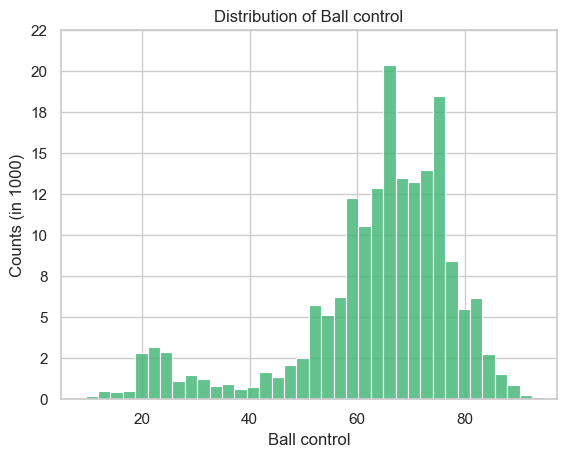

The mean value of Ball control is: 63.39
The standard deviation of Ball control is: 15.20


The TOP 3 distinct performers in the category of Ball control are:
1. Lionel Messi with Ball control of 97.0
2. Ronaldinho with Ball control of 97.0
3. Cristiano Ronaldo with Ball control of 96.0


<IPython.core.display.Javascript object>

In [30]:
player_attr_num_hist("ball_control", "Player_Attributes", football_db)

### Acceleration

A rating of the player's ability to reach their top speed quickly.

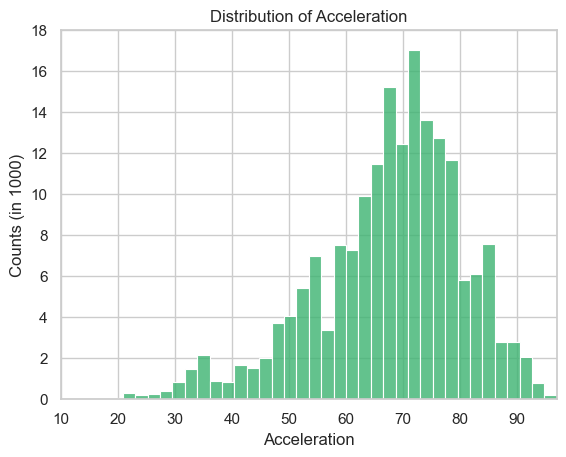

The mean value of Acceleration is: 67.66
The standard deviation of Acceleration is: 12.98


The TOP 3 distinct performers in the category of Acceleration are:
1. Cedric with Acceleration of 97.0
2. Mathis Bolly with Acceleration of 97.0
3. Theo Walcott with Acceleration of 97.0


<IPython.core.display.Javascript object>

In [31]:
player_attr_num_hist("acceleration", "Player_Attributes", football_db)

### Sprint speed

A rating of the player's top speed.

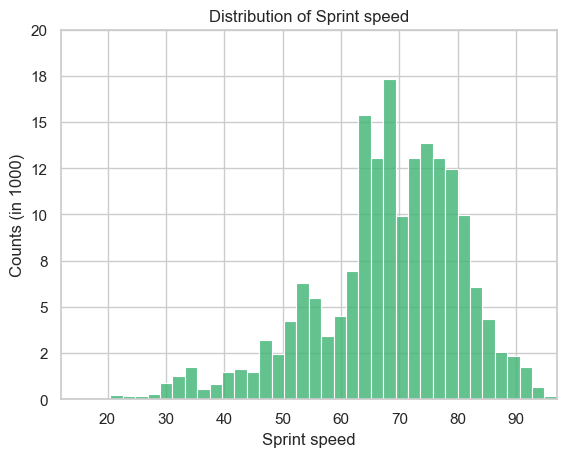

The mean value of Sprint speed is: 68.05
The standard deviation of Sprint speed is: 12.57


The TOP 3 distinct performers in the category of Sprint speed are:
1. David Odonkor with Sprint speed of 97.0
2. Mathis Bolly with Sprint speed of 97.0
3. Gabriel Agbonlahor with Sprint speed of 96.0


<IPython.core.display.Javascript object>

In [32]:
player_attr_num_hist("sprint_speed", "Player_Attributes", football_db)

### Agility

A rating of the player's ability to change body position quickly and effectively.

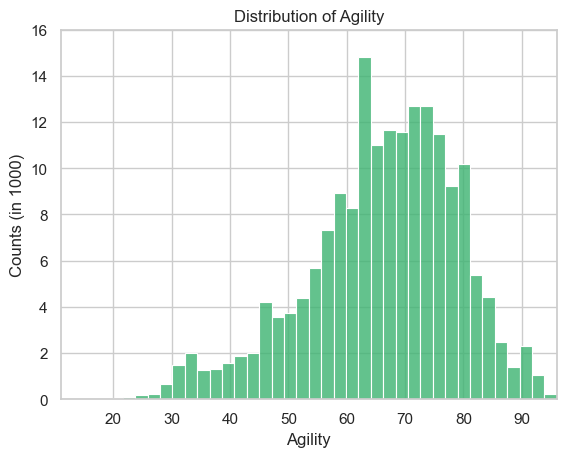

The mean value of Agility is: 65.97
The standard deviation of Agility is: 12.95


The TOP 3 distinct performers in the category of Agility are:
1. Emanuele Giaccherini with Agility of 96.0
2. Lionel Messi with Agility of 96.0
3. Maxi Moralez with Agility of 96.0


<IPython.core.display.Javascript object>

In [33]:
player_attr_num_hist("agility", "Player_Attributes", football_db)

### Reactions

A rating of the player's ability to respond quickly to changes in the situation (like a pass or a shot).

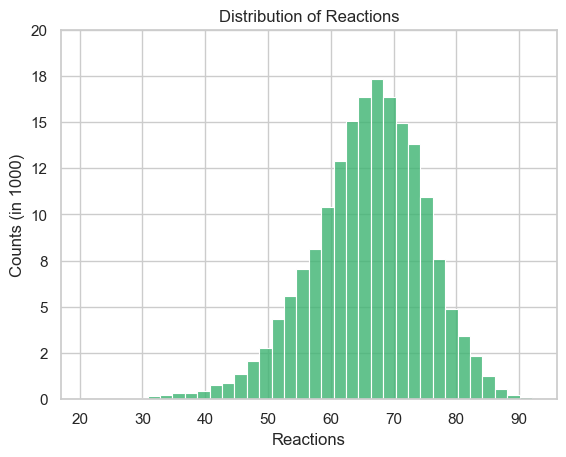

The mean value of Reactions is: 66.10
The standard deviation of Reactions is: 9.16


The TOP 3 distinct performers in the category of Reactions are:
1. Arjen Robben with Reactions of 96.0
2. Fernando Torres with Reactions of 96.0
3. Lionel Messi with Reactions of 96.0


<IPython.core.display.Javascript object>

In [34]:
player_attr_num_hist("reactions", "Player_Attributes", football_db)

### Balance

A rating of the player's ability to stay upright and not fall over when challenged.

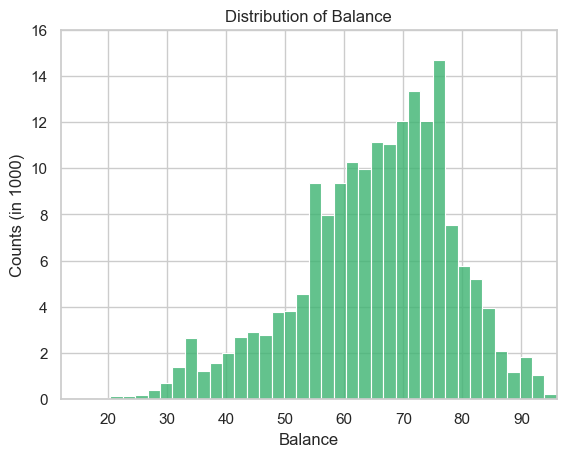

The mean value of Balance is: 65.19
The standard deviation of Balance is: 13.06


The TOP 3 distinct performers in the category of Balance are:
1. Chaker Alhadhur with Balance of 96.0
2. Diego Buonanotte with Balance of 96.0
3. Gaetan Krebs with Balance of 96.0


<IPython.core.display.Javascript object>

In [35]:
player_attr_num_hist("balance", "Player_Attributes", football_db)

### Shot power

A rating of the power behind the player's shots at the goal.

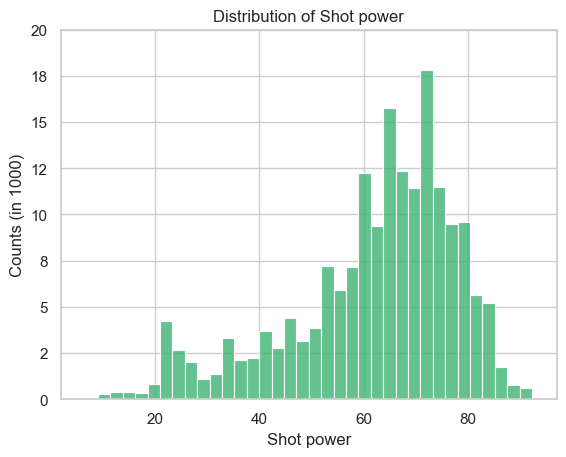

The mean value of Shot power is: 61.81
The standard deviation of Shot power is: 16.14


The TOP 3 distinct performers in the category of Shot power are:
1. John Arne Riise with Shot power of 97.0
2. Adriano with Shot power of 96.0
3. Ronny with Shot power of 96.0


<IPython.core.display.Javascript object>

In [36]:
player_attr_num_hist("shot_power", "Player_Attributes", football_db)

### Jumping

A rating of the player's ability to jump high, often important for headers.

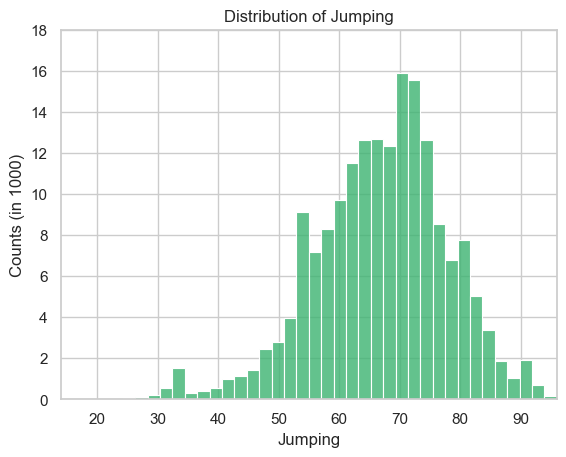

The mean value of Jumping is: 66.97
The standard deviation of Jumping is: 11.01


The TOP 3 distinct performers in the category of Jumping are:
1. Aritz Aduriz with Jumping of 96.0
2. Claudio Beauvue with Jumping of 96.0
3. Kei Ansu Kamara with Jumping of 96.0


<IPython.core.display.Javascript object>

In [37]:
player_attr_num_hist("jumping", "Player_Attributes", football_db)

### Stamina

A rating of the player's endurance and how long they can play at their top level.

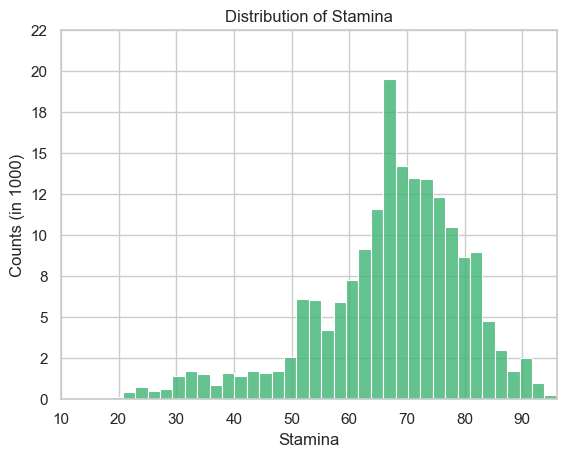

The mean value of Stamina is: 67.04
The standard deviation of Stamina is: 13.17


The TOP 3 distinct performers in the category of Stamina are:
1. Michael Essien with Stamina of 96.0
2. Roger Espinoza with Stamina of 96.0
3. Blaise Matuidi with Stamina of 95.0


<IPython.core.display.Javascript object>

In [38]:
player_attr_num_hist("stamina", "Player_Attributes", football_db)

### Strength

A rating of the player's physical strength.

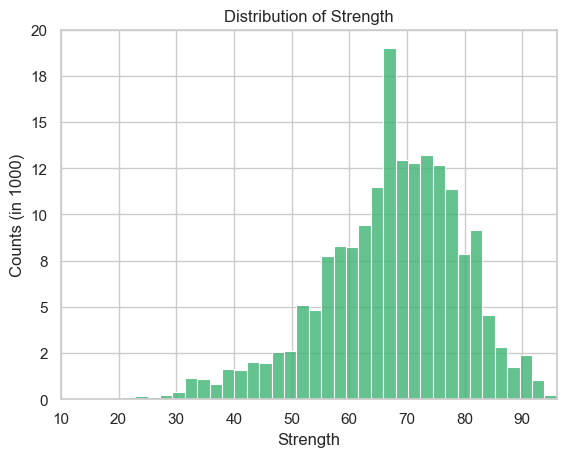

The mean value of Strength is: 67.42
The standard deviation of Strength is: 12.07


The TOP 3 distinct performers in the category of Strength are:
1. Christopher Samba with Strength of 96.0
2. Daniel van Buyten with Strength of 96.0
3. Didier Drogba with Strength of 96.0


<IPython.core.display.Javascript object>

In [39]:
player_attr_num_hist("strength", "Player_Attributes", football_db)

### Long shots

A rating of the player's ability to shoot accurately from a distance.

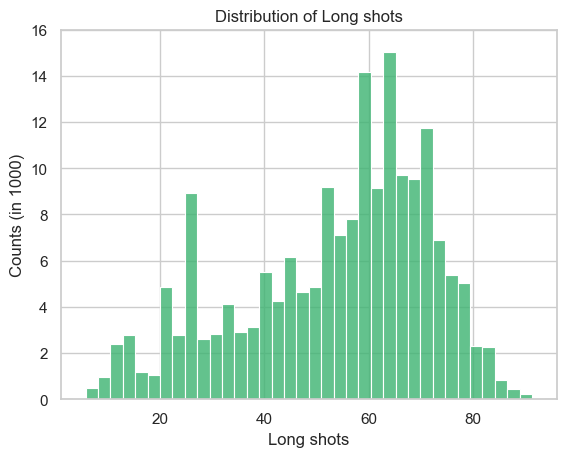

The mean value of Long shots is: 53.34
The standard deviation of Long shots is: 18.37


The TOP 3 distinct performers in the category of Long shots are:
1. Steven Gerrard with Long shots of 96.0
2. Frank Lampard with Long shots of 95.0
3. Diego Forlan with Long shots of 94.0


<IPython.core.display.Javascript object>

In [40]:
player_attr_num_hist("long_shots", "Player_Attributes", football_db)

### Aggression

A rating of the player's aggressiveness in their style of play.

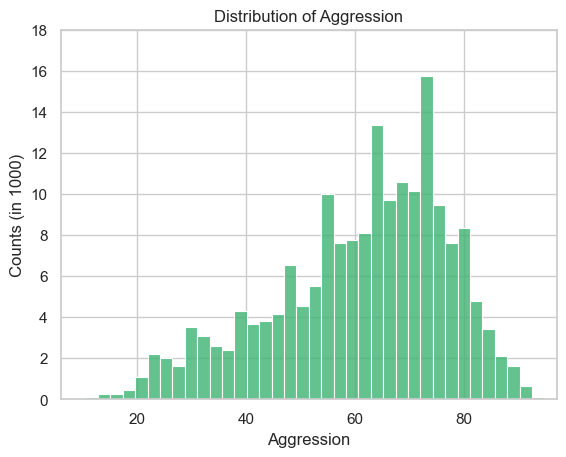

The mean value of Aggression is: 60.95
The standard deviation of Aggression is: 16.09


The TOP 3 distinct performers in the category of Aggression are:
1. Gennaro Gattuso with Aggression of 97.0
2. Joey Barton with Aggression of 97.0
3. Martin Demichelis with Aggression of 97.0


<IPython.core.display.Javascript object>

In [41]:
player_attr_num_hist("aggression", "Player_Attributes", football_db)

### Interceptions

A rating of the player's ability to intercept the ball.

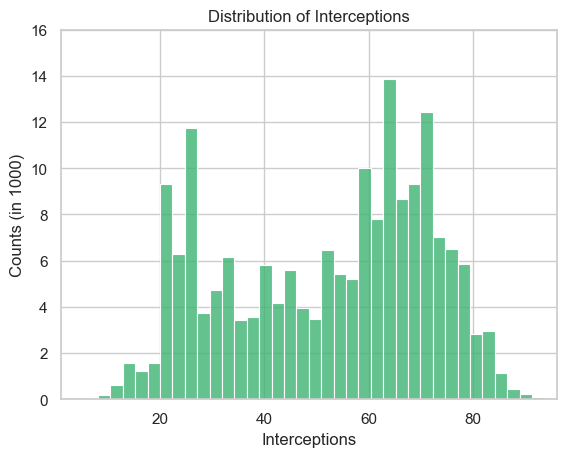

The mean value of Interceptions is: 52.01
The standard deviation of Interceptions is: 19.45


The TOP 3 distinct performers in the category of Interceptions are:
1. Andrea Pirlo with Interceptions of 96.0
2. Timmy Simons with Interceptions of 96.0
3. Paolo Maldini with Interceptions of 95.0


<IPython.core.display.Javascript object>

In [42]:
player_attr_num_hist("interceptions", "Player_Attributes", football_db)

### Positioning

A rating of the player's ability to position themselves well, particularly in attack.

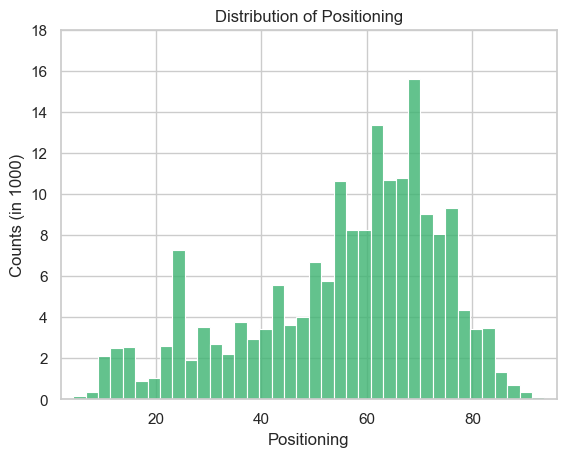

The mean value of Positioning is: 55.79
The standard deviation of Positioning is: 18.45


The TOP 3 distinct performers in the category of Positioning are:
1. Paolo Maldini with Positioning of 96.0
2. Alberto Gilardino with Positioning of 95.0
3. Andrea Pirlo with Positioning of 95.0


<IPython.core.display.Javascript object>

In [43]:
player_attr_num_hist("positioning", "Player_Attributes", football_db)

### Vision

A rating of the player

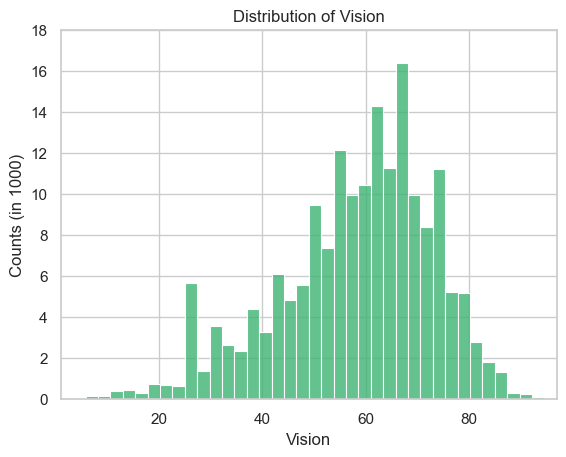

The mean value of Vision is: 57.87
The standard deviation of Vision is: 15.14


The TOP 3 distinct performers in the category of Vision are:
1. Xavi Hernandez with Vision of 97.0
2. Andrea Pirlo with Vision of 96.0
3. Wesley Sneijder with Vision of 94.0


<IPython.core.display.Javascript object>

In [44]:
player_attr_num_hist("vision", "Player_Attributes", football_db)

### Marking

This skill pertains to the ability of a player to keep close to an opponent in order to restrict their tactical opportunities. In other words, it is the ability to track and defend an opposing player.

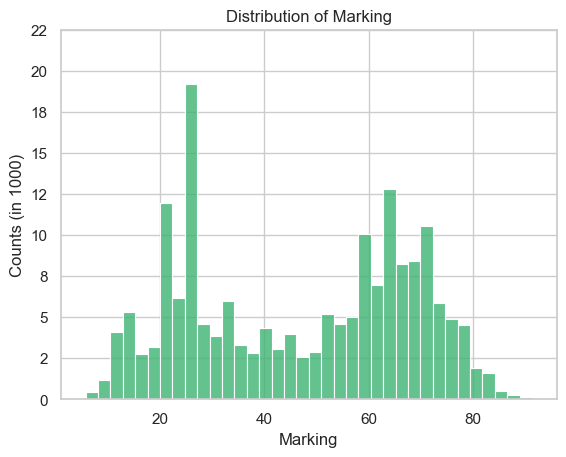

The mean value of Marking is: 46.77
The standard deviation of Marking is: 21.23


The TOP 3 distinct performers in the category of Marking are:
1. Fabio Cannavaro with Marking of 96.0
2. Alessandro Nesta with Marking of 94.0
3. Carles Puyol with Marking of 94.0


<IPython.core.display.Javascript object>

In [45]:
player_attr_num_hist("marking", "Player_Attributes", football_db)

### Standing tackle

This metric quantifies a player's ability to win the ball back from an opponent while standing.

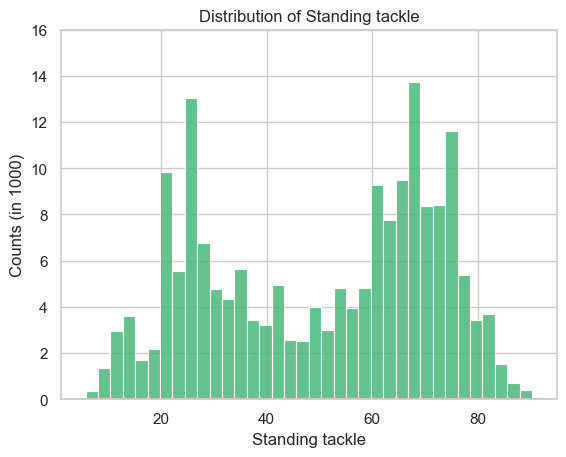

The mean value of Standing tackle is: 50.35
The standard deviation of Standing tackle is: 21.48


The TOP 3 distinct performers in the category of Standing tackle are:
1. Alessandro Nesta with Standing tackle of 95.0
2. John Terry with Standing tackle of 95.0
3. Nemanja Vidic with Standing tackle of 95.0


<IPython.core.display.Javascript object>

In [46]:
player_attr_num_hist("standing_tackle", "Player_Attributes", football_db)

### Sliding tackle

This measures the player's ability to perform a successful tackle while sliding. A good sliding tackle can dispossess an opponent of the ball without committing a foul.

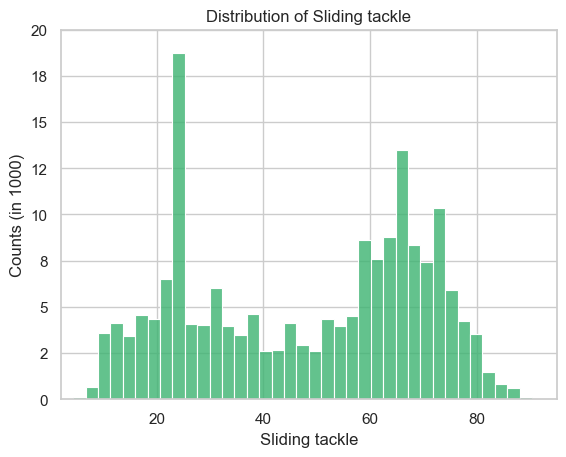

The mean value of Sliding tackle is: 48.00
The standard deviation of Sliding tackle is: 21.60


The TOP 3 distinct performers in the category of Sliding tackle are:
1. Philipp Lahm with Sliding tackle of 95.0
2. Pepe with Sliding tackle of 94.0
3. Ashley Cole with Sliding tackle of 92.0


<IPython.core.display.Javascript object>

In [47]:
player_attr_num_hist("sliding_tackle", "Player_Attributes", football_db)

### Goal keeper (GK) diving

This refers to a goalkeeper's skill at diving to make saves. A higher rating indicates the goalkeeper is better at reaching shots close to the ground.

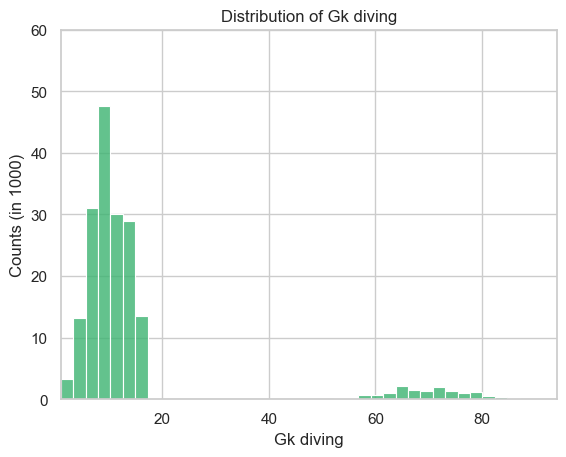

The mean value of Gk diving is: 14.70
The standard deviation of Gk diving is: 16.87


The TOP 3 distinct performers in the category of Gk diving are:
1. Iker Casillas with Gk diving of 94.0
2. Petr Cech with Gk diving of 94.0
3. David James with Gk diving of 93.0


<IPython.core.display.Javascript object>

In [48]:
player_attr_num_hist("gk_diving", "Player_Attributes", football_db)

### Goal keeper (GK) handling

This assesses the goalkeeper's skill at holding onto the ball when making a save, reducing the chance of the ball becoming loose and presenting another opportunity to the opposition.

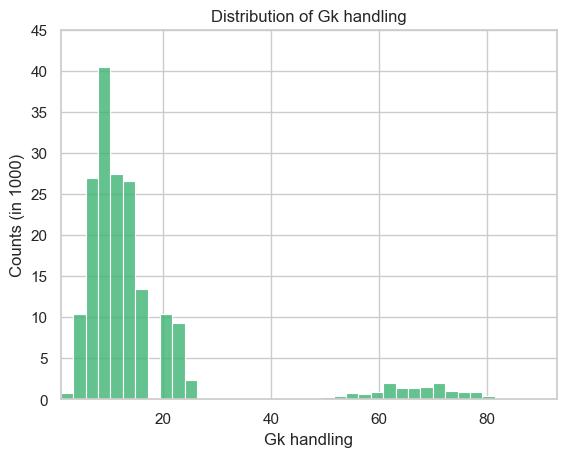

The mean value of Gk handling is: 16.06
The standard deviation of Gk handling is: 15.87


The TOP 3 distinct performers in the category of Gk handling are:
1. Gianluigi Buffon with Gk handling of 93.0
2. Jens Lehmann with Gk handling of 92.0
3. Edwin van der Sar with Gk handling of 91.0


<IPython.core.display.Javascript object>

In [49]:
player_attr_num_hist("gk_handling", "Player_Attributes", football_db)

### Goal keeper (GK) kicking

This metric measures the goalkeeper's skill at clearing the ball or passing it to a teammate using his feet. Goalkeepers with a high kicking rating can distribute the ball more accurately and to greater distances.

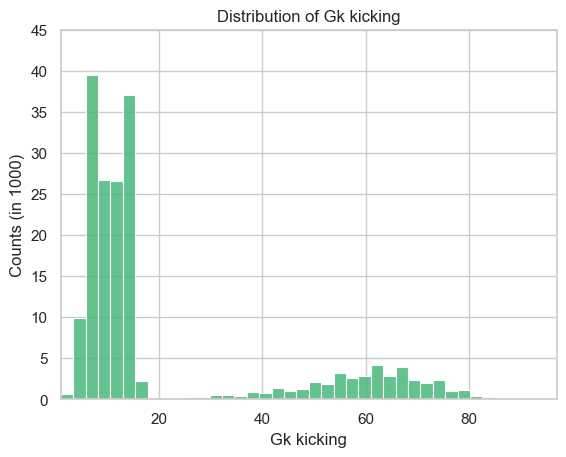

The mean value of Gk kicking is: 21.00
The standard deviation of Gk kicking is: 21.45


The TOP 3 distinct performers in the category of Gk kicking are:
1. Andrea Pirlo with Gk kicking of 97.0
2. Cesc Fabregas with Gk kicking of 95.0
3. David Beckham with Gk kicking of 95.0


<IPython.core.display.Javascript object>

In [50]:
player_attr_num_hist("gk_kicking", "Player_Attributes", football_db)

### Goal keeper (GK) positioning

This is the ability of a goalkeeper to position himself correctly in goal, making it easier to save shots. A high positioning rating means the goalkeeper will be better at being in the right place at the right time to stop shots on goal.

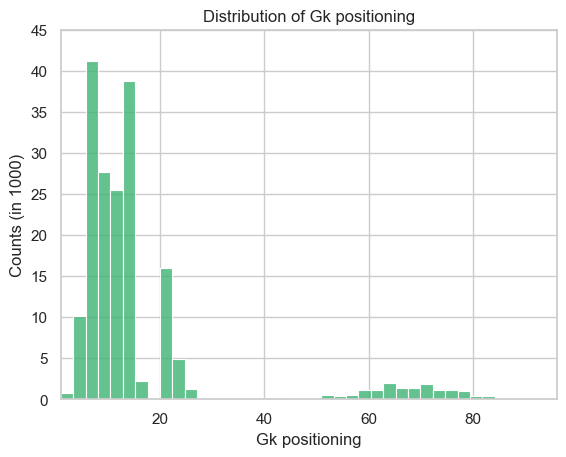

The mean value of Gk positioning is: 16.13
The standard deviation of Gk positioning is: 16.10


The TOP 3 distinct performers in the category of Gk positioning are:
1. Gianluigi Buffon with Gk positioning of 96.0
2. Edwin van der Sar with Gk positioning of 94.0
3. Iker Casillas with Gk positioning of 94.0


<IPython.core.display.Javascript object>

In [51]:
player_attr_num_hist("gk_positioning", "Player_Attributes", football_db)

### Goal keeper (GK) reflexes

This measures a goalkeeper's ability to react to unpredictable situations, such as deflected shots or close-range shots. Higher reflexes mean the goalkeeper is better at making quick saves.

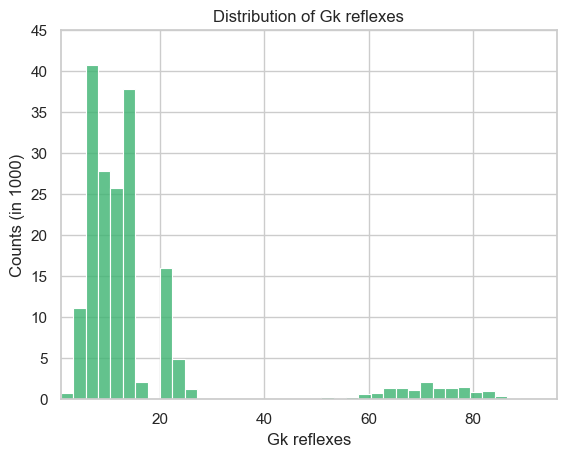

The mean value of Gk reflexes is: 16.44
The standard deviation of Gk reflexes is: 17.20


The TOP 3 distinct performers in the category of Gk reflexes are:
1. Iker Casillas with Gk reflexes of 96.0
2. Petr Cech with Gk reflexes of 94.0
3. Sebastian Frey with Gk reflexes of 94.0


<IPython.core.display.Javascript object>

In [52]:
player_attr_num_hist("gk_reflexes", "Player_Attributes", football_db)

## Overview of categorical Players attributes

### Prefered foot

In [53]:
unique_values_feature(football_db, "Player_Attributes", "preferred_foot")

Unique values of 'preferred_foot' in Player_Attributes table:
right, left, None


<IPython.core.display.Javascript object>

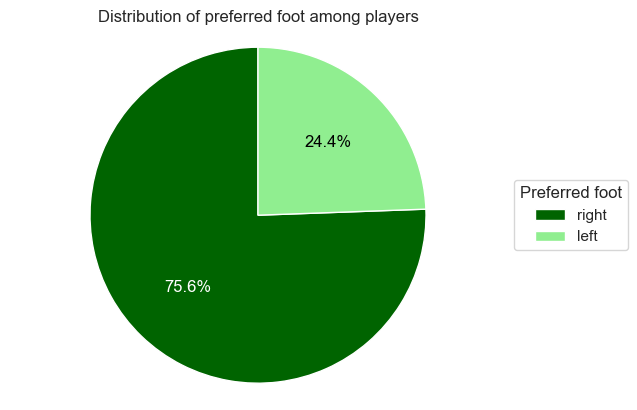

<IPython.core.display.Javascript object>

In [54]:
with sqlite3.connect(football_db) as conn:
    df = pd.read_sql_query("SELECT preferred_foot FROM Player_Attributes", conn)

# handle rows with missing values
df.dropna(inplace=True)

foot_counts = df["preferred_foot"].value_counts()

colors = ["darkgreen", "lightgreen"] if len(foot_counts) == 2 else ["darkgreen"]

wedges, texts, autotexts = plt.pie(
    foot_counts, colors=colors, autopct="%1.1f%%", startangle=90
)

for text, color in zip(autotexts, colors):
    text.set_color("white" if color == "darkgreen" else "black")

plt.legend(
    wedges,
    foot_counts.index,
    title="Preferred foot",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1),
)

plt.title("Distribution of preferred foot among players")
plt.axis("equal")
plt.show()

Roughly quarter of the players use left foot as a dominating one, while mostly used remains the right one.

### Attacking work rate

In [55]:
unique_values_feature(football_db, "Player_Attributes", "attacking_work_rate")

Unique values of 'attacking_work_rate' in Player_Attributes table:
medium, high, None, low, None, le, norm, stoc, y


<IPython.core.display.Javascript object>

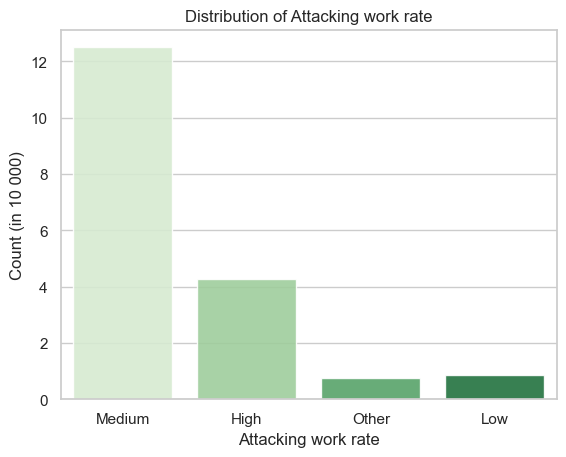

<IPython.core.display.Javascript object>

In [56]:
# Use the function
player_attr_cat_dist("attacking_work_rate")

### Defensive work rate

In [57]:
unique_values_feature(football_db, "Player_Attributes", "defensive_work_rate")

Unique values of 'defensive_work_rate' in Player_Attributes table:
medium, high, low, _0, None, 5, ean, o, 1, ormal, 7, 2, 8, 4, tocky, 0, 3, 6, 9, es


<IPython.core.display.Javascript object>

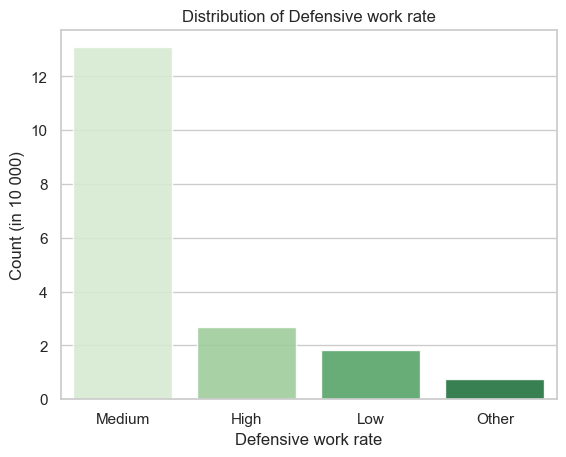

<IPython.core.display.Javascript object>

In [58]:
# Use the function
player_attr_cat_dist("defensive_work_rate")

## Corelations

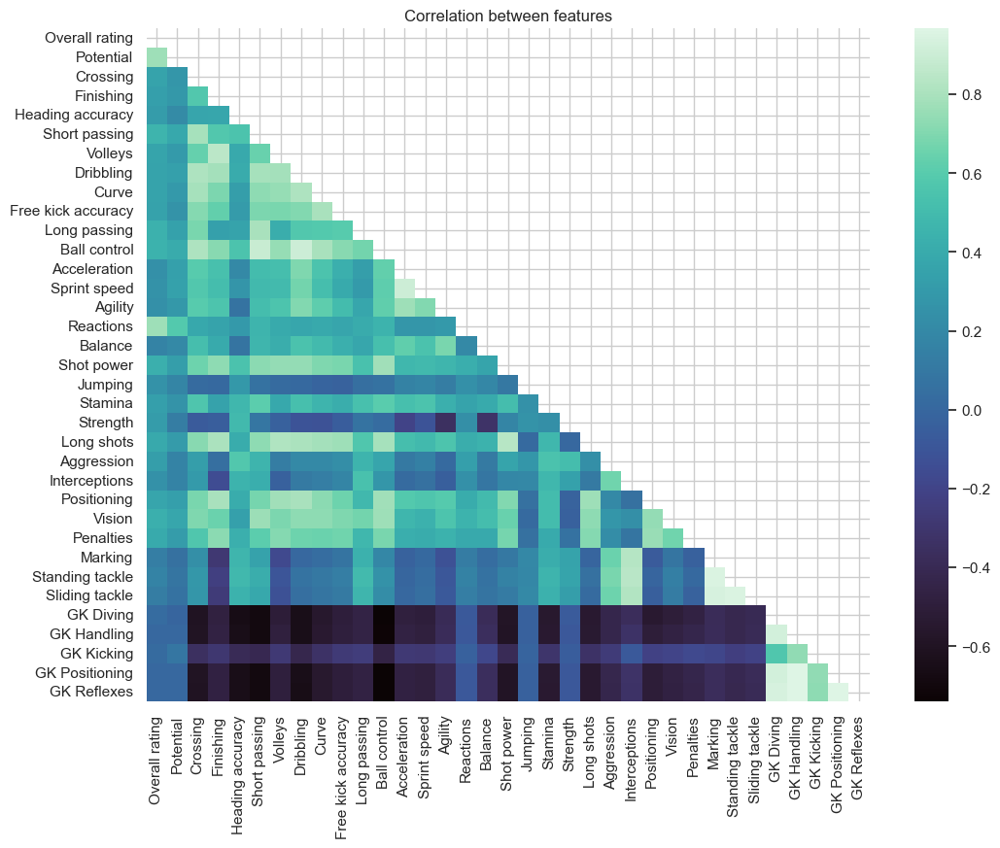

Stronger positive correlation is observed between these features:
('Dribbling', 'Ball control')
('Acceleration', 'Sprint speed')
('Marking', 'Standing tackle')
('Marking', 'Sliding tackle')
('Standing tackle', 'Sliding tackle')
('GK Diving', 'GK Handling')
('GK Diving', 'GK Positioning')
('GK Diving', 'GK Reflexes')
('GK Handling', 'GK Positioning')
('GK Handling', 'GK Reflexes')
('GK Positioning', 'GK Reflexes')


Stronger negative correlation is observed between these features:
('Ball control', 'GK Diving')
('Ball control', 'GK Handling')
('Ball control', 'GK Positioning')
('Ball control', 'GK Reflexes')


<IPython.core.display.Javascript object>

In [59]:

with sqlite3.connect(football_db) as conn:
    
    df = pd.read_sql_query("SELECT * FROM player_attributes", conn)


df = df.drop(["id", "player_fifa_api_id", "player_api_id", "date"], axis=1)


df = df.select_dtypes(include=[np.number])

# Rename the columns
df.columns = [
    col.replace("_", " ").capitalize()
    if not col.startswith("gk_")
    else "GK " + col[3:].replace("_", " ").capitalize()
    for col in df.columns
]

# Create a correlation matrix
correlation_matrix = df.corr()

# Mask in order to hinde diagonal part
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(12, 9))
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap="mako", mask=mask)
plt.xticks(rotation=90)
plt.title("Correlation between features")
plt.show()

# Thresholds for correlation coef., set just as an experiment
positive_threshold = 0.9
negative_threshold = -0.7

# Make pairs of positively and negatively correlated features, above the thr.
pos_corr_pairs = [
    (i, j)
    for i in range(len(correlation_matrix.columns))
    for j in range(i + 1, len(correlation_matrix.columns))
    if correlation_matrix.iloc[i, j] > positive_threshold
]

neg_corr_pairs = [
    (i, j)
    for i in range(len(correlation_matrix.columns))
    for j in range(i + 1, len(correlation_matrix.columns))
    if correlation_matrix.iloc[i, j] < negative_threshold
]

# Get names and construct pairs of such features to be displayed
pos_corr_pairs = [(df.columns[i], df.columns[j]) for i, j in pos_corr_pairs]
neg_corr_pairs = [(df.columns[i], df.columns[j]) for i, j in neg_corr_pairs]

# Print results below the matrix to better spot what might be correlated; again, 0.4 value chosen kind of arbitrary
print("Stronger positive correlation is observed between these features:")
for pair in pos_corr_pairs:
    print(pair)

print("\n")

print("Stronger negative correlation is observed between these features:")
for pair in neg_corr_pairs:
    print(pair)

From correlation analysis it is evident that correlations between attributes assigned to goalkeepers are strong. At the same time goal keepers have problems controlling the ball, as can be expected, as they are generally not playing.

Positive correlation is also seen between the features that involve similar properties, such as acceleration and sprint speed.

# Player

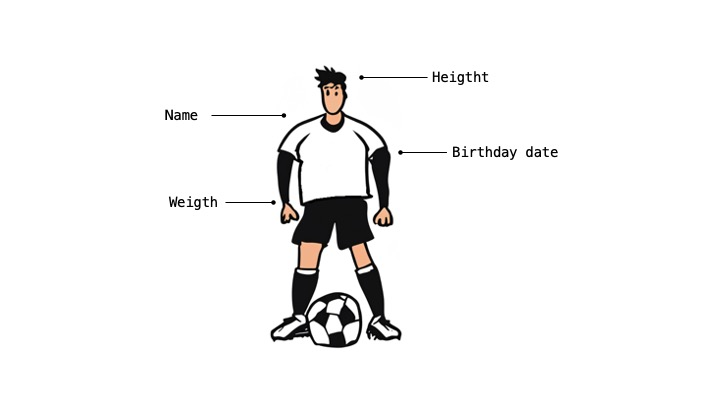

In [60]:
with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'Player' LIMIT 5;", conn)
    display(df)

,id,player_api_id,player_name,player_fifa_api_id,birthday,height,weight
0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
1,2,155782,Aaron Cresswell,189615,1989-12-15 00:00:00,170.18,146
2,3,162549,Aaron Doran,186170,1991-05-13 00:00:00,170.18,163
3,4,30572,Aaron Galindo,140161,1982-05-08 00:00:00,182.88,198
4,5,23780,Aaron Hughes,17725,1979-11-08 00:00:00,182.88,154


<IPython.core.display.Javascript object>

In [61]:
basic_table_analysis(football_db, "Player")

Total number of rows in Player: 11060
Number of duplicate rows: 0


Total number of features in Player: 7


,Feature name,Data type,Missing values (count),Missing values (%),Min value,Max value
id,id,int64,0,0.0,1.00,11075.00
player_api_id,player_api_id,int64,0,0.0,2625.00,750584.00
player_name,player_name,object,0,0.0,NaN,NaN
player_fifa_api_id,player_fifa_api_id,int64,0,0.0,2.00,234141.00
birthday,birthday,object,0,0.0,NaN,NaN
height,height,float64,0,0.0,157.48,208.28
weight,weight,int64,0,0.0,117.00,243.00


<IPython.core.display.Javascript object>

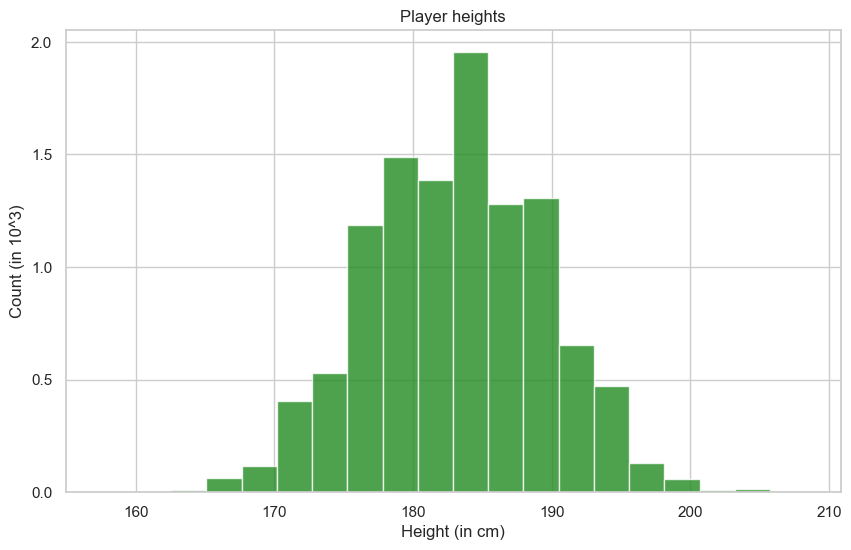

Average height of players: 181.9 cm
Coefficient of variation (cv) of height: 3.5%


<IPython.core.display.Javascript object>

In [62]:
with sqlite3.connect(football_db) as conn:
    df = pd.read_sql_query("SELECT height FROM Player", conn)

# Custom plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(df["height"], bins=20, alpha=0.8, color="forestgreen")
yticks = np.arange(0, 2001, 500)
plt.yticks(yticks, [f"{y/1000:.1f}" for y in yticks])
ax.set_title("Player heights")
ax.set_xlabel("Height (in cm)")
ax.set_ylabel("Count (in 10^3)")
plt.show()

# Calculate average height and print
average_height = df["height"].mean()
print(f"Average height of players: {average_height:.1f} cm")

# Calculate the standard deviation of height and variation (cv), print
std_dev_height = df["height"].std()
cv_height = (std_dev_height / average_height) * 100
print(f"Coefficient of variation (cv) of height: {cv_height:.1f}%")

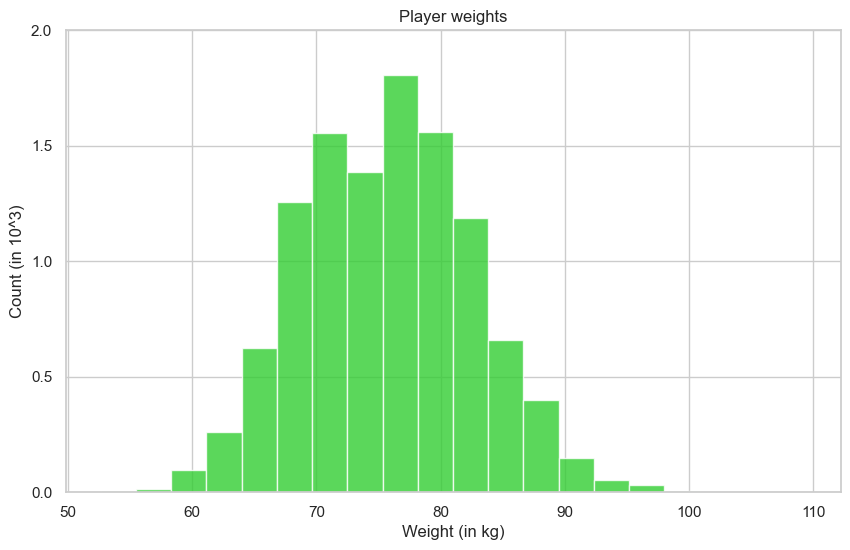

Average weight of players: 75.8 kg
Coefficient of variation (cv) for weight: 8.9%


<IPython.core.display.Javascript object>

In [63]:
with sqlite3.connect(football_db) as conn:
    df = pd.read_sql_query("SELECT weight FROM Player", conn)

# Convert weight from lb to kg (1 lb = 0.45kg)
df["weight"] = df["weight"] * 0.45

# Custom plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(df["weight"], bins=20, alpha=0.8, color="limegreen")
yticks = np.arange(0, 2001, 500)
plt.yticks(yticks, [f"{y/1000:.1f}" for y in yticks])
ax.set_title("Player weights")
ax.set_xlabel("Weight (in kg)")
ax.set_ylabel("Count (in 10^3)")
plt.show()

# Calculate average weight and print
average_weight = df["weight"].mean()
print(f"Average weight of players: {average_weight:.1f} kg")

# Calculate the standard deviation of weight and variation (cv), print
sd_weight = df["weight"].std()
cv_weight = (sd_weight / average_weight) * 100
print(f"Coefficient of variation (cv) for weight: {cv_weight:.1f}%")

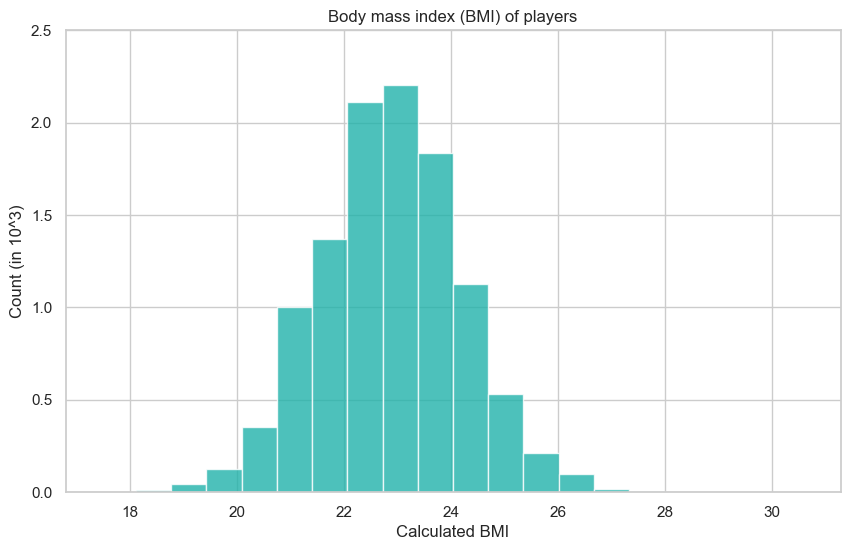

Average BMI: 22.9
Percentage of players with low BMI (below 18.5, underweight): 0.1%
Percentage of players with high BMI (above 25, overweight): 5.0%
*Data of BMI intervals from www.nhlbi.nih.gov


<IPython.core.display.Javascript object>

In [64]:
with sqlite3.connect(football_db) as conn:
    players = pd.read_sql_query("SELECT height, weight FROM Player", conn)

# Convert height and weight (1 lb = 0.45 kg) and calc. BMI
players["height"] = players["height"] / 100
players["weight"] = players["weight"] * 0.45
players["bmi"] = players["weight"] / (players["height"] ** 2)

# Custom plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(players["bmi"], bins=20, alpha=0.8, color="lightseagreen")
yticks = np.arange(0, 2501, 500)
plt.yticks(yticks, [f"{y/1000:.1f}" for y in yticks])
ax.set_title("Body mass index (BMI) of players")
ax.set_xlabel("Calculated BMI")
ax.set_ylabel("Count (in 10^3)")
plt.show()

# Recalculate average BMI
average_bmi = players["bmi"].mean()
print(f"Average BMI: {average_bmi:.1f}")

# Calculate average percentages and print corresponding statements
low_bmi_percent = (players["bmi"] < 18.5).mean() * 100
high_bmi_percent = (players["bmi"] > 25).mean() * 100

print(
    f"Percentage of players with low BMI (below 18.5, underweight): {low_bmi_percent:.1f}%"
)
print(
    f"Percentage of players with high BMI (above 25, overweight): {high_bmi_percent:.1f}%"
)
print("*Data of BMI intervals from www.nhlbi.nih.gov")

Average height of the football player is 181.9 cm, and weight is 75.8 kg. There are more overweight players (around 5%) than underweight (only around 0.1%). However, majority of the players have a normal body mass index, averaged at 22.5 as could be expected. The height is more uniform among the players then the weight.

In [65]:
with sqlite3.connect(football_db) as conn:
    player_df = pd.read_sql_query(
        "SELECT player_api_id, height, weight FROM Player", conn
    )
    performance_df = pd.read_sql_query(
        "SELECT player_api_id, overall_rating FROM Player_Attributes", conn
    )

player_df["weight"] = player_df["weight"] * 0.45

# Merge player_df and attributes_df on player_api_id column
merged_df = pd.merge(player_df, performance_df, on="player_api_id")

# Drop missing values
merged_df.dropna(inplace=True)

# Calculate correlation and print
correlation_with_height = merged_df["height"].corr(merged_df["overall_rating"])
correlation_with_weight = merged_df["weight"].corr(merged_df["overall_rating"])

print(
    f"Correlation of performance (overall performance) with height: {round(correlation_with_height, 3)}"
)
print(
    f"Correlation of performance (overall performance) with weight: {round(correlation_with_weight, 3)}"
)

Correlation of performance (overall performance) with height: -0.003
Correlation of performance (overall performance) with weight: 0.064


<IPython.core.display.Javascript object>

It seems that there is no direct correlation between height and weight of the players and their performance score. 

!!! Additional analysis idea: Maybe there are correlations between height/weight and other attributes of a player that could suggest what role should it have in a team.

First names of football players by popularity:


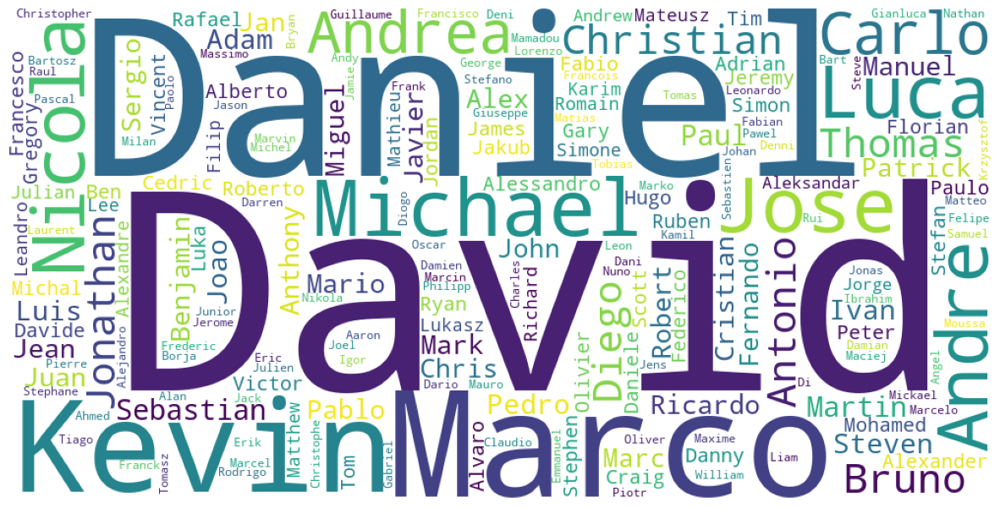




Last names of football players by popularity:


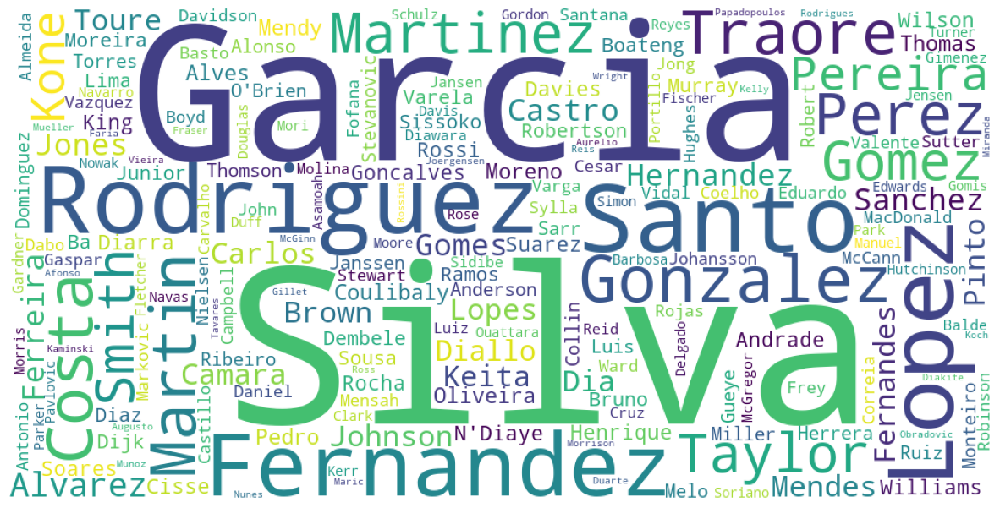

<IPython.core.display.Javascript object>

In [66]:
with sqlite3.connect(football_db) as conn:
    df = pd.read_sql_query("SELECT player_name FROM Player", conn)

df[["First_name", "Last_name"]] = df.player_name.str.rsplit(pat=" ", n=1, expand=True)

# Remove players that either first name or last name is missing
df = df.dropna()

# Exclude from the word cloud
stopwords = {"van", "da", "de", "dos", "do", "el", "der"}

print("First names of football players by popularity:")
names_for_wordcloud(df["First_name"].tolist(), stopwords)

print("\n\n")

print("Last names of football players by popularity:")
names_for_wordcloud(df["Last_name"].tolist(), stopwords)

It seems that **David** is the most popular first name for a football player, while **Silva** is the most popular last name.

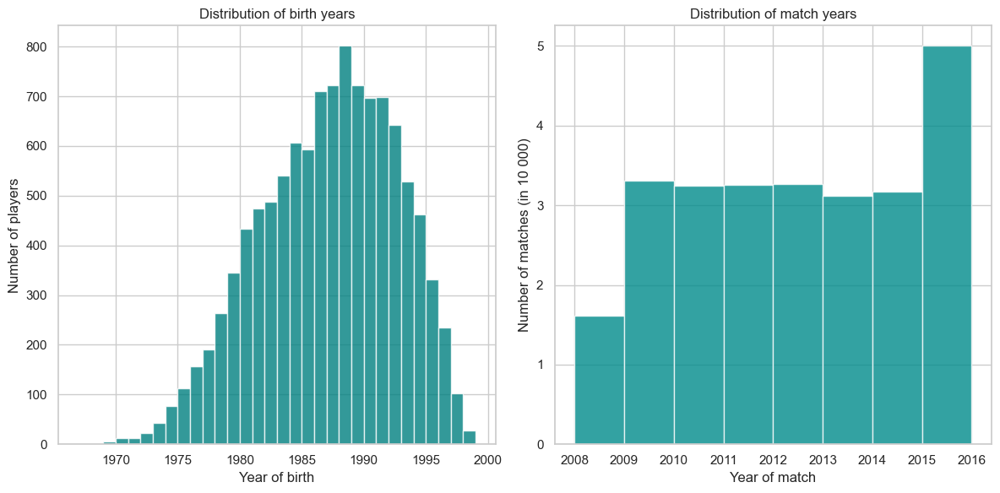

<IPython.core.display.Javascript object>

In [67]:
with sqlite3.connect(football_db) as conn:
    players = pd.read_sql_query("SELECT birthday FROM Player", conn)
    matches = pd.read_sql_query("SELECT date FROM Match", conn)

# Convert birthdays and match dates to datetime
players["birthday"] = pd.to_datetime(players["birthday"])
matches["date"] = pd.to_datetime(matches["date"])

# Extract year from birthday and from the match date
players["birth_year"] = players["birthday"].dt.year
matches["match_year"] = matches["date"].dt.year

# Two plots
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot histogram of 'Distribution of birth years'
axs[0].hist(
    players["birth_year"],
    bins=range(players["birth_year"].min(), players["birth_year"].max() + 1),
    # edgecolor="black",
    color="teal",
    alpha=0.8,
)
axs[0].set_title("Distribution of birth years")
axs[0].set_xlabel("Year of birth")
axs[0].set_ylabel("Number of players")

# Plot histogram of 'Distribution of match years'
axs[1].hist(
    matches["match_year"],
    bins=range(matches["match_year"].min(), matches["match_year"].max() + 1),
    # edgecolor="black",
    color="darkcyan",
    alpha=0.8,
)
axs[1].set_title("Distribution of match years")
axs[1].set_xlabel("Year of match")

# Define a function to divide y-values by 1000
def format_func(value, tick_number):
    return f"{value / 1000:.0f}"


# Apply the function to the y-axis
axs[1].yaxis.set_major_formatter(ticker.FuncFormatter(format_func))
axs[1].set_ylabel("Number of matches (in 10 000)")

plt.tight_layout()
plt.show()

Players in this analysis are born approximately from 1970 to 1999. However, the data about matches are historical - from 2008 to 2016. Thus, further analysis of ages require recalculation of player ages at the time the matches were played.

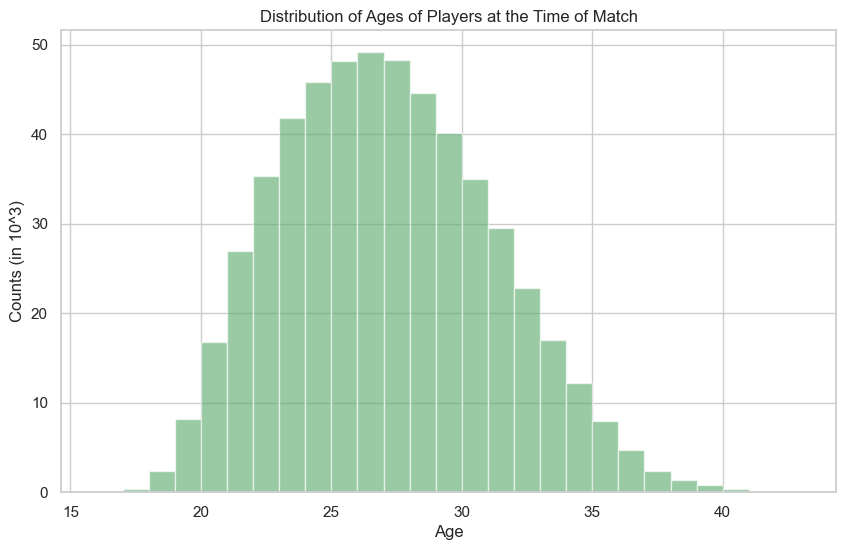

Average age of a football player at the time of the match: 26.7


<IPython.core.display.Javascript object>

In [68]:
with sqlite3.connect(football_db) as conn:

    # Query to fetch date of matches and birth dates of home players
    query_home = """
    SELECT 
        Match.date, 
        Player.birthday
    FROM 
        Match
    JOIN
        Player ON Player.player_api_id = Match.home_player_1 OR Player.player_api_id = Match.home_player_2 OR 
                    Player.player_api_id = Match.home_player_3 OR Player.player_api_id = Match.home_player_4 OR 
                    Player.player_api_id = Match.home_player_5 OR Player.player_api_id = Match.home_player_6 OR 
                    Player.player_api_id = Match.home_player_7 OR Player.player_api_id = Match.home_player_8 OR 
                    Player.player_api_id = Match.home_player_9 OR Player.player_api_id = Match.home_player_10 OR 
                    Player.player_api_id = Match.home_player_11
    """

    # Query to fetch date of matches and birth dates of away players
    query_away = """
    SELECT 
        Match.date, 
        Player.birthday
    FROM 
        Match
    JOIN
        Player ON Player.player_api_id = Match.away_player_1 OR Player.player_api_id = Match.away_player_2 OR 
                    Player.player_api_id = Match.away_player_3 OR Player.player_api_id = Match.away_player_4 OR 
                    Player.player_api_id = Match.away_player_5 OR Player.player_api_id = Match.away_player_6 OR 
                    Player.player_api_id = Match.away_player_7 OR Player.player_api_id = Match.away_player_8 OR 
                    Player.player_api_id = Match.away_player_9 OR Player.player_api_id = Match.away_player_10 OR 
                    Player.player_api_id = Match.away_player_11
    """

    # Fetch data
    data_home = pd.read_sql_query(query_home, conn)
    data_away = pd.read_sql_query(query_away, conn)

# Concatenate data
data = pd.concat([data_home, data_away])

# Convert to datetime and extract year
data["date"] = pd.to_datetime(data["date"]).dt.year
data["birthday"] = pd.to_datetime(data["birthday"]).dt.year

# Calculate ages and drop NA values
data["age"] = data["date"] - data["birthday"]
data = data.dropna()

fig, ax = plt.subplots(figsize=(10, 6))

# Plot age distribution
ax.hist(data["age"], bins=27, alpha=0.6, color="g")

# Define a function to divide y-values by 1000
def format_func(value, tick_number):
    return f'{value / 1000:.0f}'

# Apply the function to the y-axis
ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_func))

ax.set_title("Distribution of Ages of Players at the Time of Match")
ax.set_xlabel("Age")
ax.set_ylabel("Counts (in 10^3)")
plt.show()

# Calculate and print the average age
average_age = data["age"].mean()
print(f"Average age of a football player at the time of the match: {round(average_age, 1)}")


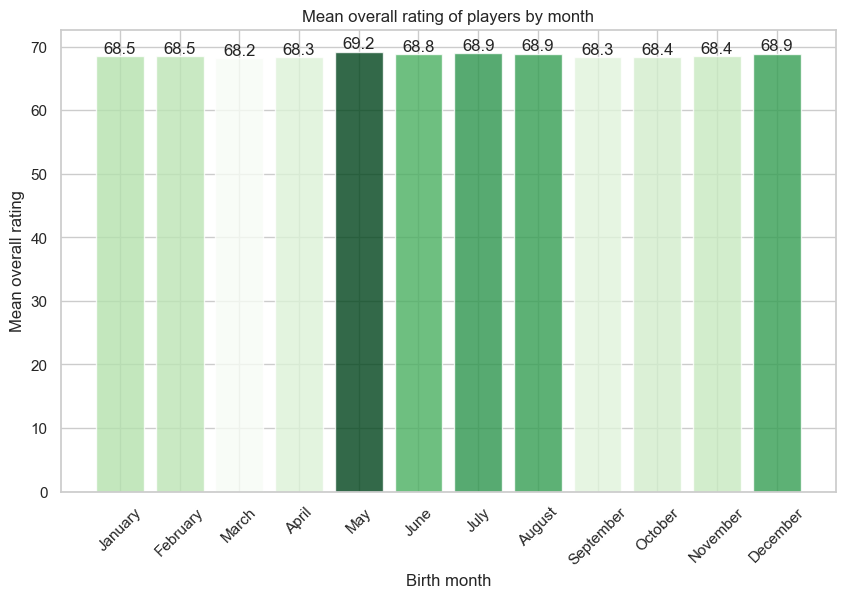

<IPython.core.display.Javascript object>

In [69]:

with sqlite3.connect(football_db) as conn:
    player_df = pd.read_sql_query("SELECT player_api_id, birthday FROM Player", conn)
    attributes_df = pd.read_sql_query("SELECT player_api_id, overall_rating FROM Player_Attributes", conn)

# Convert birthday to datetime and extract the month
player_df['birthday'] = pd.to_datetime(player_df['birthday'])
player_df['birth_month'] = player_df['birthday'].dt.month

# Merge player_df with attributes_df on player_api_id
merged_df = pd.merge(player_df, attributes_df, on='player_api_id')

# Compute mean ratings by birth month
mean_ratings = merged_df.groupby('birth_month')['overall_rating'].mean()

# Create a bar chart
plt.figure(figsize=(10, 6))

# Scale the mean ratings to [0, 1] range
scaler = MinMaxScaler()
scaled_mean_ratings = scaler.fit_transform(mean_ratings.values.reshape(-1, 1)).flatten()

# Generate a color map
colors = cm.Greens(scaled_mean_ratings)

bars = plt.bar(mean_ratings.index, mean_ratings.values, color=colors, alpha=0.8)

# Label the chart
plt.xlabel('Birth month')
plt.ylabel('Mean overall rating')
plt.title('Mean overall rating of players by month')

# Add scores to the top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 1), ha='center', va='bottom')

# Add month names
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
plt.xticks(mean_ratings.index, month_names, rotation=45)

# Display the chart
plt.show()


Some research suggesting that the month of birth can have an impact on athletic or academic performance. This effect is known as the Relative Age Effect (RAE). It could be associated with the time person is starting school or sports school depending on his age at the time that the school season officially started. It could also be related to other factors not explored here.

Considering data of this dataset, players born in May and subsequent summer months (June, July and August, also in December) have a trend to demonstrate slightly better overall performance.

To explain this phenomenon in this particular case, analysis of school system and traditions related the majority of countries that these players were born could be helpful.

However, statistical significance can be tested regarding this dataset.

**Null Hypothesis (H0):** There is no difference in the mean overall rating of players born in different months. In other words, the month of birth does not have an effect on a player's overall rating.

**Alternative Hypothesis (HA):** There is a difference in the mean overall rating of players born in different months. Meaning, the month of birth does have an effect on a player's overall rating.

In [70]:
# Perform the ANOVA test
with sqlite3.connect(football_db) as conn:
    players = pd.read_sql_query("SELECT player_api_id, birthday FROM Player", conn)
    attributes = pd.read_sql_query(
        "SELECT player_api_id, overall_rating FROM Player_Attributes", conn
    )

# Merge the two DataFrames on player_api_id
df = pd.merge(players, attributes, on="player_api_id")

# Convert the birthday to datetime and extract the month
df["birthday"] = pd.to_datetime(df["birthday"])
df["birth_month"] = df["birthday"].dt.month

mean_ratings = df.groupby("birth_month")["overall_rating"].mean()


f_val, p_val = f_oneway(
    *[group["overall_rating"].dropna() for name, group in df.groupby("birth_month")]
)

print("F-value:", f_val)
print("p-value:", p_val)

F-value: 30.917117027156948
p-value: 3.5150779243063516e-66


<IPython.core.display.Javascript object>

p-value much is much much smaller than 0.05 (confidence level), we can reject the null hypothesis and conclude that *there is a statistically significant difference in the mean overall ratings of players born in different months*.

# Match table

In [71]:
with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'Match' LIMIT 5;", conn)
    display(df)

,id,country_id,league_id,season,stage,...,GBD,GBA,BSH,BSD,BSA
0,1,1,1,2008/2009,1,...,3.25,4.00,1.73,3.40,4.20
1,2,1,1,2008/2009,1,...,3.25,3.75,1.91,3.25,3.60
2,3,1,1,2008/2009,1,...,3.20,2.50,2.30,3.20,2.75
3,4,1,1,2008/2009,1,...,3.75,5.50,1.44,3.75,6.50
4,5,1,1,2008/2009,1,...,3.50,1.65,4.75,3.30,1.67


<IPython.core.display.Javascript object>

In [72]:
names_features(football_db, "Match")

Names of features in Match table are:

id, country_id, league_id, season, stage, date, match_api_id, home_team_api_id, away_team_api_id, home_team_goal, away_team_goal, home_player_X1, home_player_X2, home_player_X3, home_player_X4, home_player_X5, home_player_X6, home_player_X7, home_player_X8, home_player_X9, home_player_X10, home_player_X11, away_player_X1, away_player_X2, away_player_X3, away_player_X4, away_player_X5, away_player_X6, away_player_X7, away_player_X8, away_player_X9, away_player_X10, away_player_X11, home_player_Y1, home_player_Y2, home_player_Y3, home_player_Y4, home_player_Y5, home_player_Y6, home_player_Y7, home_player_Y8, home_player_Y9, home_player_Y10, home_player_Y11, away_player_Y1, away_player_Y2, away_player_Y3, away_player_Y4, away_player_Y5, away_player_Y6, away_player_Y7, away_player_Y8, away_player_Y9, away_player_Y10, away_player_Y11, home_player_1, home_player_2, home_player_3, home_player_4, home_player_5, home_player_6, home_player_7, home_player_8,

<IPython.core.display.Javascript object>

In [73]:
pd.set_option("display.max_rows", None)
display(basic_table_analysis(football_db, "Match"))
pd.set_option("display.max_rows", 15)

Total number of rows in Match: 25979
Number of duplicate rows: 0


Total number of features in Match: 115


,Feature name,Data type,Missing values (count),Missing values (%),Min value,Max value
id,id,int64,0,0.00,1.00,25979.0
country_id,country_id,int64,0,0.00,1.00,24558.0
league_id,league_id,int64,0,0.00,1.00,24558.0
season,season,object,0,0.00,NaN,NaN
stage,stage,int64,0,0.00,1.00,38.0
date,date,object,0,0.00,NaN,NaN
match_api_id,match_api_id,int64,0,0.00,483129.00,2216672.0
home_team_api_id,home_team_api_id,int64,0,0.00,1601.00,274581.0
away_team_api_id,away_team_api_id,int64,0,0.00,1601.00,274581.0
home_team_goal,home_team_goal,int64,0,0.00,0.00,10.0


<IPython.core.display.Javascript object>

## Betting agencies

Shortlisted names are likely betting agencies, for example: B365 could stand for *Bet365*, IW for *Interwetten*.
Last letter of each name are likely the outcome of the game, as follows:

- H - home team win
- D - draw game
- A - away win.

one could then interpret the meaning as such: B365H score is an odd provided by Bet365 for the home team to win football mach.

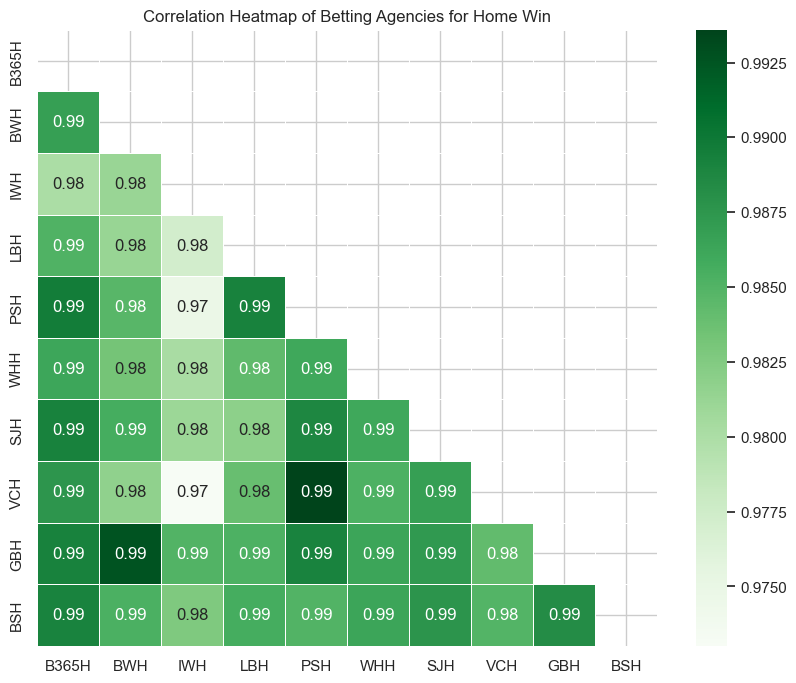

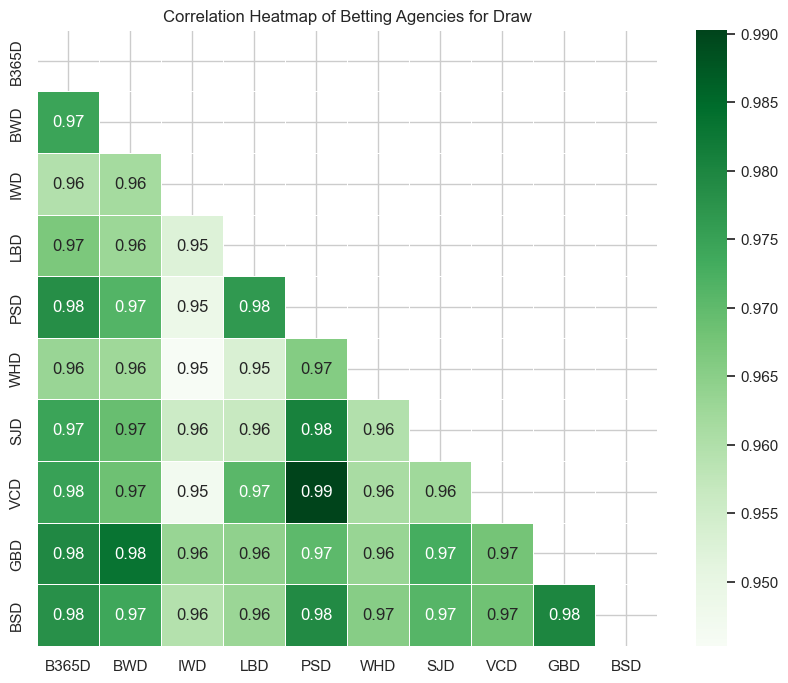

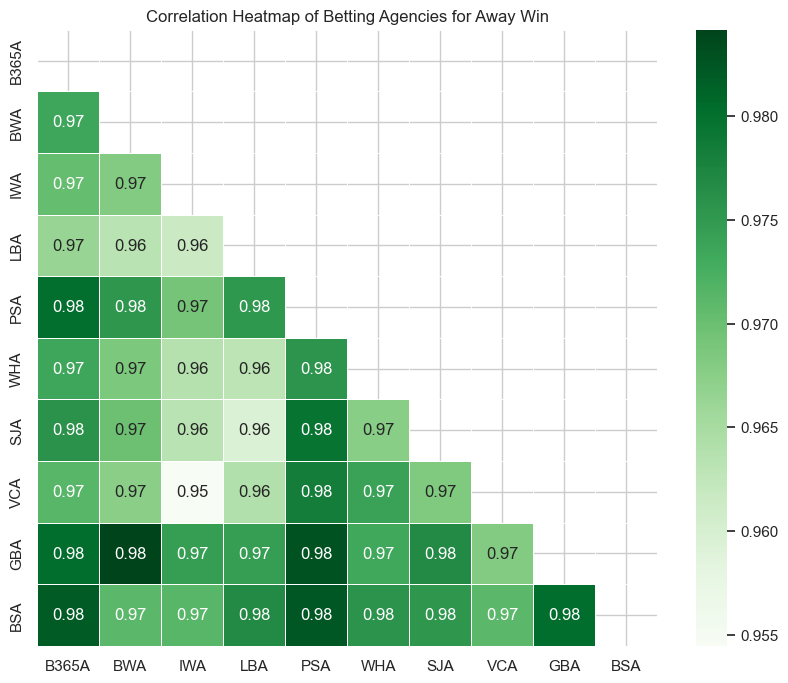

<IPython.core.display.Javascript object>

In [74]:
with sqlite3.connect(football_db) as conn:
    df_betting = pd.read_sql_query("SELECT B365H, BWH, IWH, LBH, PSH, WHH, SJH, VCH, GBH, BSH FROM Match", conn)

# Calculate correlations
corr = df_betting.corr()

# Generate a mask for the upper triangle 
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap='Greens', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Betting Agencies for Home Win')
plt.show()

with sqlite3.connect(football_db) as conn:
    df_betting = pd.read_sql_query("SELECT B365D, BWD, IWD, LBD, PSD, WHD, SJD, VCD, GBD, BSD FROM Match", conn)

# Calculate correlations
corr = df_betting.corr()

# Generate a mask for the upper triangle 
mask = np.triu(np.ones_like(corr, dtype=bool))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap='Greens', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Betting Agencies for Draw')
plt.show()

with sqlite3.connect(football_db) as conn:
    df_betting = pd.read_sql_query("SELECT B365A, BWA, IWA, LBA, PSA, WHA, SJA, VCA, GBA, BSA FROM Match", conn)

# Calculate correlations
corr = df_betting.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))


plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap='Greens', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Betting Agencies for Away Win')
plt.show()


Betting agency scores are highly correlated.

## Home advantage

In [75]:
with sqlite3.connect(football_db) as conn:
    # Load data from Match into a DataFrame
    matches = pd.read_sql_query(
        "SELECT home_team_goal, away_team_goal FROM Match", conn
    )

# Calculate the average home and away goals
average_home_goals = matches["home_team_goal"].mean()
average_away_goals = matches["away_team_goal"].mean()

print(f"Average home team goals: {average_home_goals:.2f}")
print(f"Average away team goals: {average_away_goals:.2f}")

# Check for home advantage
if average_home_goals > average_away_goals:
    print("There appears to be a home advantage.")
else:
    print("There does not appear to be a home advantage.")

Average home team goals: 1.54
Average away team goals: 1.16
There appears to be a home advantage.


<IPython.core.display.Javascript object>

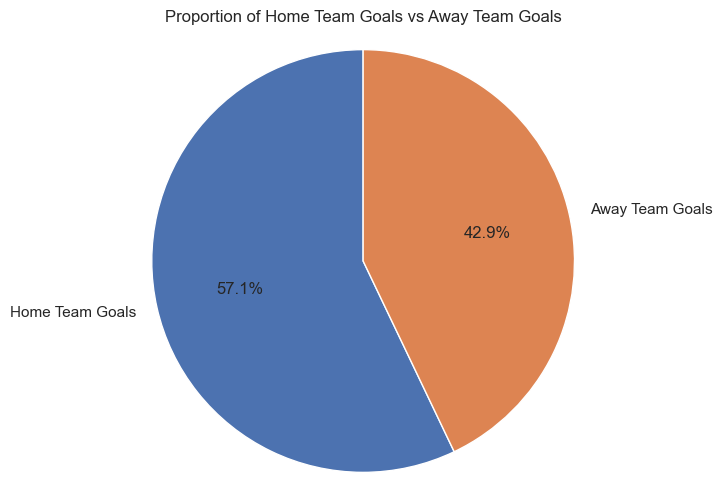

<IPython.core.display.Javascript object>

In [76]:
# Calculate the total home and away goals
total_home_goals = matches["home_team_goal"].sum()
total_away_goals = matches["away_team_goal"].sum()

# Prepare data for the pie chart
goals = [total_home_goals, total_away_goals]
labels = ["Home Team Goals", "Away Team Goals"]

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(goals, labels=labels, autopct="%1.1f%%", startangle=90)
plt.axis("equal")  # Equal aspect ratio ensures the pie chart is circular.
plt.title("Proportion of Home Team Goals vs Away Team Goals")

# Display the plot
plt.show()

In [77]:
# Prepare to export to Looker studio
df = pd.DataFrame(data={"Labels": labels, "Goals": goals})
df.to_csv("goal_data.csv", index=False)

<IPython.core.display.Javascript object>

Let's formulate and check hypothesis about home advantage.

**Null Hypothesis**: There is no difference in the number of goals scored by home teams and away teams - the home advantage does not exist.

**Alternative Hypothesis**: There is a significant difference in the number of goals scored by home teams versus away teams - the home advantage does exist.

In [78]:
with sqlite3.connect(football_db) as conn:
    matches = pd.read_sql_query(
        "SELECT home_team_goal, away_team_goal FROM Match", conn
    )

# Perform a two-sample t-test
t_stat, p_value = stats.ttest_ind(matches['home_team_goal'], matches['away_team_goal'])

print(f'T-statistic: {t_stat:.2f}')
print(f'p-value: {p_value:.2f}')

# If the p-value is less than 0.05, we reject the null hypothesis
if p_value < 0.05:
    print('There appears to be a statistically significant home advantage.')
else:
    print('There does not appear to be a statistically significant home advantage.')


T-statistic: 35.78
p-value: 0.00
There appears to be a statistically significant home advantage.


<IPython.core.display.Javascript object>

## Top scorrers

In [79]:
with sqlite3.connect(football_db) as conn:
    # Query the unique values in the 'goal' column of the Match table
    goal_df = pd.read_sql_query("SELECT DISTINCT goal FROM Match", conn)

# Display the first 100 unique values
for goal in goal_df['goal'].dropna()[:1]:
    print(goal + "\n")


<goal><value><comment>n</comment><stats><goals>1</goals><shoton>1</shoton></stats><event_incident_typefk>406</event_incident_typefk><elapsed>22</elapsed><player2>38807</player2><subtype>header</subtype><player1>37799</player1><sortorder>5</sortorder><team>10261</team><id>378998</id><n>295</n><type>goal</type><goal_type>n</goal_type></value><value><comment>n</comment><stats><goals>1</goals><shoton>1</shoton></stats><event_incident_typefk>393</event_incident_typefk><elapsed>24</elapsed><player2>24154</player2><subtype>shot</subtype><player1>24148</player1><sortorder>4</sortorder><team>10260</team><id>379019</id><n>298</n><type>goal</type><goal_type>n</goal_type></value></goal>



<IPython.core.display.Javascript object>

In [80]:
import xml.etree.ElementTree as ET
from xml.etree.ElementTree import ParseError
import sqlite3
import pandas as pd

def parse_goal_data(goal_data):
    # If the data is None, return
    if goal_data is None:
        return

    try:
        # Parse the XML data
        root = ET.fromstring(goal_data)

        # For each 'value' tag in the data
        for value in root.findall('value'):
            # Print each child tag and its text
            for child in value:
                print(f"{child.tag}: {child.text}")
                
    except ParseError:
        # If a ParseError is raised, return
        return

with sqlite3.connect(football_db) as conn:
    # Load data from Match table into a DataFrame
    df = pd.read_sql_query("SELECT goal FROM Match", conn)

# Drop the None rows
df = df.dropna()

# Get the first three rows containing XML data
first_three_rows = df['goal'].iloc[:3]

# Apply the function to each of the three rows
for row in first_three_rows:
    parse_goal_data(row)


comment: n
stats: None
event_incident_typefk: 406
elapsed: 22
player2: 38807
subtype: header
player1: 37799
sortorder: 5
team: 10261
id: 378998
n: 295
type: goal
goal_type: n
comment: n
stats: None
event_incident_typefk: 393
elapsed: 24
player2: 24154
subtype: shot
player1: 24148
sortorder: 4
team: 10260
id: 379019
n: 298
type: goal
goal_type: n
comment: n
stats: None
event_incident_typefk: 393
elapsed: 4
player2: 39297
subtype: shot
player1: 26181
sortorder: 2
team: 9825
id: 375546
n: 231
type: goal
goal_type: n
comment: n
stats: None
event_incident_typefk: 407
elapsed: 83
player2: 30889
subtype: distance
player1: 30853
sortorder: 0
team: 8650
id: 378041
n: 344
type: goal
goal_type: n


<IPython.core.display.Javascript object>

Each data tag could mean the following:

- `comment`: It's not clear what 'n' stands for in this context, but this field may be used to include additional information or comments about the goal.
- `stats`: This field may contain statistics related to the goal event, such as the distance of the shot, the speed of the ball, etc. In this case, it's `None`, indicating that no specific statistics were recorded for this goal.
- `event_incident_typefk`: This could be a foreign key reference to a table or list that classifies different types of events/incidents in a match. `406` is likely the ID of the specific event type that corresponds to this goal.
- `elapsed`: This probably represents the minute of the match when the goal was scored.
- `player1` and `player2`: These could be the IDs of the players involved in the goal. `player1` might be the player who scored, and `player2` could be the player who assisted, but this is just a guess.
- `subtype`: This field probably describes the manner of the goal. In this case, 'header' means the player scored the goal using their head.
- `sortorder`: This might be used to order the goals or events of the match.
- `team`: This is likely the ID of the team that scored the goal.
- `id`: This is probably the unique ID of the goal event.
- `n`: The meaning of this field is unclear. It might be used internally for some specific purpose related to the database or the system that generated this data.
- `type`: This field describes the type of the event, which is a 'goal' in this case.
- `goal_type`: Like `comment`, it's not clear what 'n' stands for in this context. This field may be used to further categorize the goal, for example, whether it was a penalty, an own goal, etc.

In [81]:
pd.set_option("display.max_rows", 5)

with sqlite3.connect(football_db) as conn:
    # Load data from Match into a DataFrame
    matches = pd.read_sql_query(
        "SELECT id, home_team_api_id, away_team_api_id, goal FROM Match WHERE goal IS NOT NULL",
        conn,
    )

# Initialize an empty list to hold goal data
goals_data = []

# Iterate over the matches
for idx, row in matches.iterrows():
    # Parse XML data for each match
    tree = ET.fromstring(row["goal"])
    # Iterate over the goals in the match
    for goal in tree.findall("value"):
        # Extract player ID and team ID if available
        player = goal.find("player1")
        team = goal.find("team")
        if player is not None and team is not None:
            player_id = player.text
            team_id = team.text
            # Add the goal data to the list
            goals_data.append(
                {"match_id": row["id"], "player_id": player_id, "team_id": team_id}
            )

# Convert the list of goal data into a DataFrame
goals_df = pd.DataFrame(goals_data)

goals_df

,match_id,player_id,team_id
0,1729,37799,10261
1,1729,24148,10260
...,...,...,...
39861,25949,198082,10243
39862,25949,121080,10243


<IPython.core.display.Javascript object>

In [82]:
pd.set_option("display.max_rows", 5)
# Connect to SQLite database
with sqlite3.connect(football_db) as conn:
    # Load data from Match into a DataFrame
    match_df = pd.read_sql_query("SELECT goal FROM Match", conn)

# Check for non-null entries
non_null_goals = match_df[match_df['goal'].notnull()]
non_null_goals

,goal
1728,<goal><value><comment>n</comment><stats><goals...
1729,<goal><value><comment>n</comment><stats><goals...
...,...
25947,<goal><value><comment>n</comment><stats><goals...
25948,<goal><value><comment>n</comment><stats><goals...


<IPython.core.display.Javascript object>

In [83]:
pd.set_option("display.max_rows", 5)

with sqlite3.connect(football_db) as conn:
    # Load data from Match, Team and Player into DataFrames
    match_df = pd.read_sql_query("SELECT id, league_id, goal FROM Match", conn)
    team_df = pd.read_sql_query("SELECT team_api_id, team_long_name FROM Team", conn)
    player_df = pd.read_sql_query("SELECT player_api_id, player_name FROM Player", conn)
    league_df = pd.read_sql_query("SELECT id, name FROM League", conn)  # Load data from League

# Define a function to parse XML data
def parse_goals(goal_data):
    goal_dict = {"player_id": [], "team_id": [], "match_id": []}
    
    for match_id, goal in zip(match_df["id"], match_df["goal"]):
        if goal is not None:
            root = ET.fromstring(goal)
            for value in root.findall('value'):
                player_id = value.find('player1')
                team_id = value.find('team')
                if player_id is not None and team_id is not None:
                    goal_dict["player_id"].append(player_id.text)
                    goal_dict["team_id"].append(team_id.text)
                    goal_dict["match_id"].append(match_id)
                    
    return pd.DataFrame(goal_dict)

# Parse goals from match data
goals_df = parse_goals(match_df["goal"])

# Convert player_id, team_id and match_id to numeric type
goals_df["player_id"] = pd.to_numeric(goals_df["player_id"], errors='coerce')
goals_df["team_id"] = pd.to_numeric(goals_df["team_id"], errors='coerce')

# Merge the dataframes on respective IDs
goals_df = pd.merge(goals_df, team_df, left_on="team_id", right_on="team_api_id")
goals_df = pd.merge(goals_df, player_df, left_on="player_id", right_on="player_api_id")

# Drop unnecessary columns and rename the remaining
goals_df = goals_df.drop(["team_api_id", "player_api_id", "player_id", "team_id"], axis=1)
goals_df = goals_df.rename(columns={"team_long_name": "team_name", "player_name": "player_name"})

goals_df


,match_id,team_name,player_name
0,1729,Newcastle United,Obafemi Martins
1,1747,Newcastle United,Obafemi Martins
...,...,...,...
39663,25920,FC Sion,Veroljub Salatic
39664,25947,FC Sion,Elsad Zverotic


<IPython.core.display.Javascript object>

In [84]:
# Merge league_id into goals_df
goals_df = pd.merge(
    goals_df, match_df[["id", "league_id"]], left_on="match_id", right_on="id"
)
goals_df.drop(["id", "match_id"], axis=1, inplace=True)

# Calculate number of goals per player, team, and league
goals_summary = (
    goals_df.groupby(["league_id", "team_name", "player_name"])
    .size()
    .reset_index(name="goals")
)

# Find the top scorer in each team in each league
top_scorers = goals_summary.loc[
    goals_summary.groupby(["league_id", "team_name"])["goals"].idxmax()
]

# Merge league_name into top_scorers
top_scorers = pd.merge(top_scorers, league_df, left_on="league_id", right_on="id")
top_scorers.drop(["id", "league_id"], axis=1, inplace=True)

top_scorers

,team_name,player_name,goals,name
0,Arsenal,Robin van Persie,72,England Premier League
1,Aston Villa,Gabriel Agbonlahor,53,England Premier League
...,...,...,...,...
195,Grasshopper Club Zürich,Munas Dabbur,9,Switzerland Super League
196,Lugano,Anastasios Donis,5,Switzerland Super League


<IPython.core.display.Javascript object>

In [85]:
# Rename the columns of top_scorers DataFrame
top_scorers.rename(columns={'name': 'League', 'team_name': 'Team', 'player_name': 'Player', 'goals': 'Total Goals Scored'}, inplace=True)

# Reorder the columns of the DataFrame
top_scorers = top_scorers[['League', 'Team', 'Player', 'Total Goals Scored']]

top_scorers


,League,Team,Player,Total Goals Scored
0,England Premier League,Arsenal,Robin van Persie,72
1,England Premier League,Aston Villa,Gabriel Agbonlahor,53
...,...,...,...,...
195,Switzerland Super League,Grasshopper Club Zürich,Munas Dabbur,9
196,Switzerland Super League,Lugano,Anastasios Donis,5


<IPython.core.display.Javascript object>

In [86]:
pd.set_option("display.max_rows", None)
# Top 10 scorers overall
top_10_overall = top_scorers.nlargest(10, 'Total Goals Scored')
# Rearrange the columns
top_10_overall = top_10_overall[['Player', 'Team', 'League', 'Total Goals Scored']]
print("Top 10 Scorers Overall:\n")
top_10_overall



Top 10 Scorers Overall:



,Player,Team,League,Total Goals Scored
161,Lionel Messi,FC Barcelona,Spain LIGA BBVA,295
175,Cristiano Ronaldo,Real Madrid CF,Spain LIGA BBVA,270
126,Antonio Di Natale,Udinese,Italy Serie A,156
17,Wayne Rooney,Manchester United,England Premier League,135
55,Zlatan Ibrahimovic,Paris Saint-Germain,France Ligue 1,120
69,Stefan Kiessling,Bayer 04 Leverkusen,Germany 1. Bundesliga,112
16,Sergio Aguero,Manchester City,England Premier League,105
76,Thomas Mueller,FC Bayern Munich,Germany 1. Bundesliga,94
79,Klaas Jan Huntelaar,FC Schalke 04,Germany 1. Bundesliga,88
121,Francesco Totti,Roma,Italy Serie A,86


<IPython.core.display.Javascript object>

In [87]:
# Top scorers in each league
top_in_each_league = top_scorers.loc[
    top_scorers.groupby("League")["Total Goals Scored"].idxmax()
]
# Rearrange the columns
top_in_each_league = top_in_each_league[
    ["League", "Player", "Team", "Total Goals Scored"]
]
# Sort by goals in descending order
top_in_each_league = top_in_each_league.sort_values(
    "Total Goals Scored", ascending=False
)
print("Top Scorers in Each League:\n")
top_in_each_league

Top Scorers in Each League:



,League,Player,Team,Total Goals Scored
161,Spain LIGA BBVA,Lionel Messi,FC Barcelona,295
126,Italy Serie A,Antonio Di Natale,Udinese,156
17,England Premier League,Wayne Rooney,Manchester United,135
55,France Ligue 1,Zlatan Ibrahimovic,Paris Saint-Germain,120
69,Germany 1. Bundesliga,Stefan Kiessling,Bayer 04 Leverkusen,112
142,Netherlands Eredivisie,Luuk de Jong,PSV,47
187,Switzerland Super League,Guillaume Hoarau,BSC Young Boys,17
153,Scotland Premier League,Kenny Miller,Rangers,7
148,Poland Ekstraklasa,Artjoms Rudnevs,Lech Poznań,3


<IPython.core.display.Javascript object>

# League

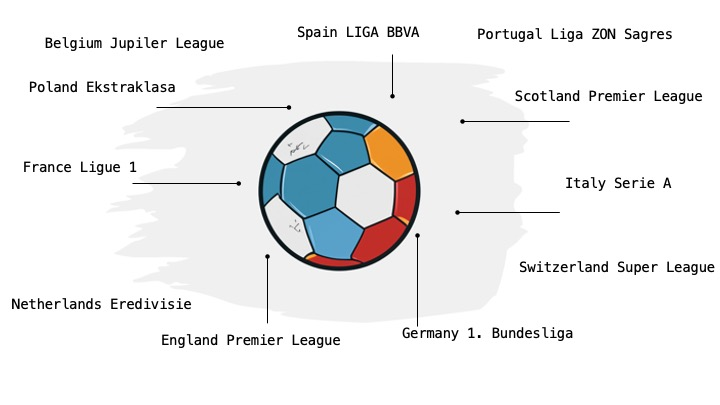

In [88]:
with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'League' LIMIT 5;", conn)
    display(df)

,id,country_id,name
0,1,1,Belgium Jupiler League
1,1729,1729,England Premier League
2,4769,4769,France Ligue 1
3,7809,7809,Germany 1. Bundesliga
4,10257,10257,Italy Serie A


<IPython.core.display.Javascript object>

In [89]:
basic_table_analysis(football_db, "League")

Total number of rows in League: 11
Number of duplicate rows: 0


Total number of features in League: 3


,Feature name,Data type,Missing values (count),Missing values (%),Min value,Max value
id,id,int64,0,0.0,1.0,24558.0
country_id,country_id,int64,0,0.0,1.0,24558.0
name,name,object,0,0.0,NaN,NaN


<IPython.core.display.Javascript object>

In [90]:
database_name = football_db
with sqlite3.connect(database_name) as conn:
    # Query the League, Country and Match tables, join
    df = pd.read_sql_query(
        """
    SELECT League.name AS league, Country.name AS country, SUM(home_team_goal + away_team_goal) AS total_goals 
    FROM Match 
    INNER JOIN League ON Match.league_id = League.id
    INNER JOIN Country ON League.country_id = Country.id
    GROUP BY League.id
    ORDER BY total_goals DESC
    """,
        conn,
    )

pd.set_option("display.max_rows", None)
display(df)
pd.set_option("display.max_rows", 15)

,league,country,total_goals
0,Spain LIGA BBVA,Spain,8412
1,England Premier League,England,8240
2,Italy Serie A,Italy,7895
3,Netherlands Eredivisie,Netherlands,7542
4,France Ligue 1,France,7427
5,Germany 1. Bundesliga,Germany,7103
6,Portugal Liga ZON Sagres,Portugal,5201
7,Belgium Jupiler League,Belgium,4841
8,Scotland Premier League,Scotland,4804
9,Poland Ekstraklasa,Poland,4656


<IPython.core.display.Javascript object>

In this table each league is assigned to its hosting country, at the same time valuable information about total goals scored (from the record of the database, thus from 2008 to 2016).

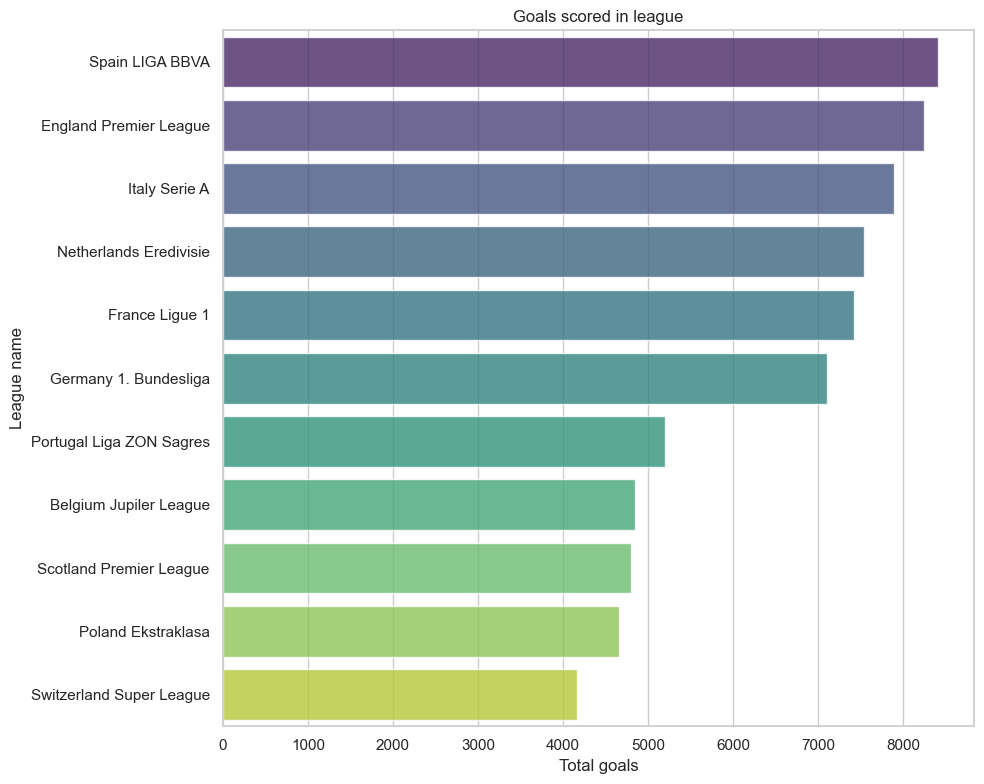

<IPython.core.display.Javascript object>

In [91]:
# Plot
plt.figure(figsize=(10, 8))
sns.barplot(x="total_goals", y="league", data=df, palette="viridis", alpha=0.8)
plt.xlabel("Total goals")
plt.ylabel("League name")
plt.title("Goals scored in league")
plt.tight_layout()
plt.show()

This graph clearly outlines what in which leagues most of the goals are scored. Spain league is the leading one, while Swiss league lags behind.

# Country

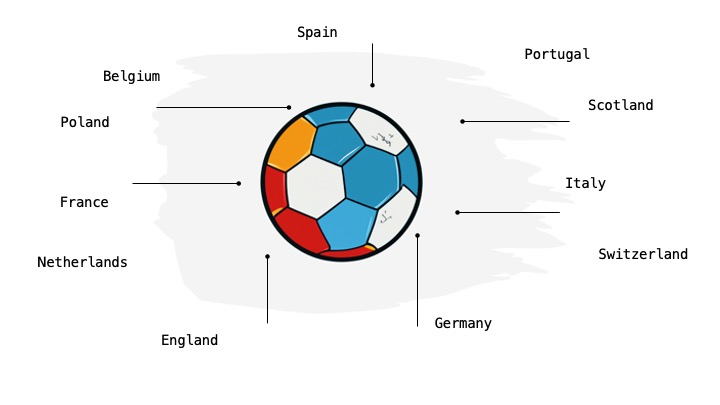

In [92]:
with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'Country' LIMIT 5;", conn)
    display(df)

,id,name
0,1,Belgium
1,1729,England
2,4769,France
3,7809,Germany
4,10257,Italy


<IPython.core.display.Javascript object>

In [93]:
basic_table_analysis(football_db, "Country")

Total number of rows in Country: 11
Number of duplicate rows: 0


Total number of features in Country: 2


,Feature name,Data type,Missing values (count),Missing values (%),Min value,Max value
id,id,int64,0,0.0,1.0,24558.0
name,name,object,0,0.0,NaN,NaN


<IPython.core.display.Javascript object>

In [94]:
database_name = football_db
with sqlite3.connect(database_name) as conn:
    # Query the Country and Match tables, join 
    country_df = pd.read_sql_query(
        """
    SELECT Country.name, COUNT(Match.id) as match_count 
    FROM Country 
    JOIN Match ON Country.id = Match.country_id 
    GROUP BY Country.name
    """,
        conn,
    )

# Print the list of countries
print("List of countries involved in matches:")
for country in sorted(country_df["name"].unique()):
    print(country)

print("\nNote: In this analysis, match counts from England and Scotland have been combined\
under the United Kingdom to correctly represent a single country.")

# Create a mapping for some special cases
name_mapping = {"England": "United Kingdom", "Scotland": "United Kingdom"}

# Apply the mapping to the country names
country_df["name"] = country_df["name"].replace(name_mapping)

# Group the data by the (possibly transformed) country names and sum the match counts
country_df = country_df.groupby("name").sum().reset_index()

# Convert country names to Alpha-3 codes
country_df["alpha_3"] = country_df["name"].apply(
    lambda x: pycountry.countries.get(name=x).alpha_3
    if pycountry.countries.get(name=x) is not None
    else None
)

fig = px.choropleth(
    country_df,
    locations="alpha_3",
    color="match_count",
    hover_name="name",
    projection="natural earth",
    color_continuous_scale="Viridis",
    title="Map of matches played in each country",
    labels={"match_count": "Number of matches"},
)

fig.show()


List of countries involved in matches:
Belgium
England
France
Germany
Italy
Netherlands
Poland
Portugal
Scotland
Spain
Switzerland

Note: In this analysis, match counts from England and Scotland have been combinedunder the United Kingdom to correctly represent a single country.


<IPython.core.display.Javascript object>

11 countries are represented in the database. As this information was already known from the "Leagues" analysis, heatmap of the total maches hosted of each country is represented here. As UK is hosting two leagues it becomes the most matches hosting country in this map.

In [95]:
# Export to CSV for Google looker studio
country_df.to_csv("country_matches.csv", index=False)

<IPython.core.display.Javascript object>

# Team

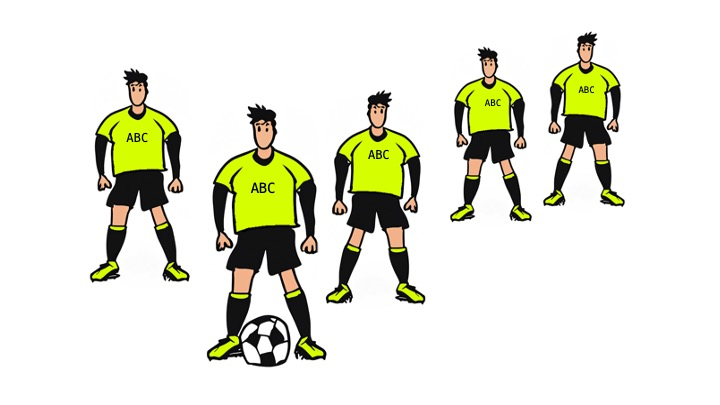

In [96]:
with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'Team' LIMIT 5;", conn)
    display(df)

,id,team_api_id,team_fifa_api_id,team_long_name,team_short_name
0,1,9987,673,KRC Genk,GEN
1,2,9993,675,Beerschot AC,BAC
2,3,10000,15005,SV Zulte-Waregem,ZUL
3,4,9994,2007,Sporting Lokeren,LOK
4,5,9984,1750,KSV Cercle Brugge,CEB


<IPython.core.display.Javascript object>

In [97]:
basic_table_analysis(football_db, "Team")

Total number of rows in Team: 299
Number of duplicate rows: 0


Total number of features in Team: 5


,Feature name,Data type,Missing values (count),Missing values (%),Min value,Max value
id,id,int64,0,0.00,1.0,51606.0
team_api_id,team_api_id,int64,0,0.00,1601.0,274581.0
team_fifa_api_id,team_fifa_api_id,float64,11,3.68,1.0,112513.0
team_long_name,team_long_name,object,0,0.00,NaN,NaN
team_short_name,team_short_name,object,0,0.00,NaN,NaN


<IPython.core.display.Javascript object>

Team names by popularity:


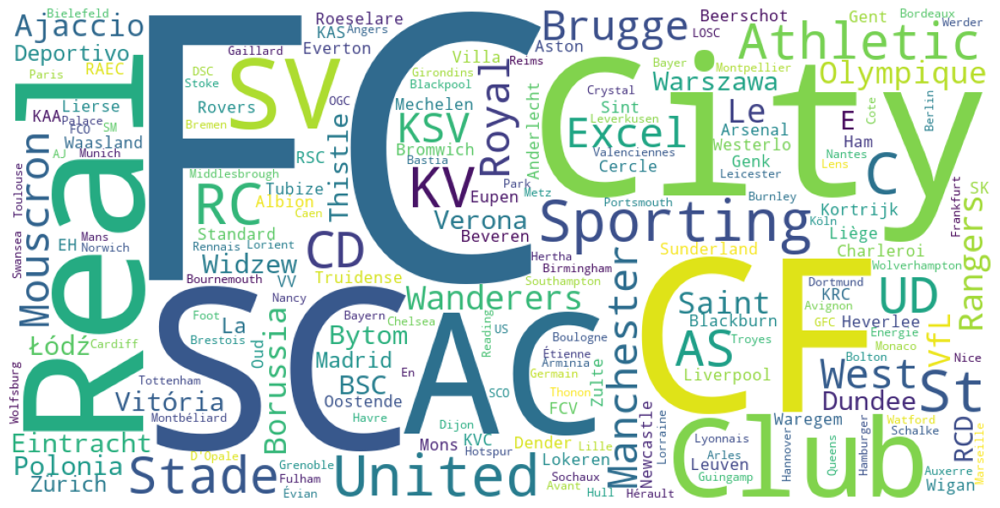

<IPython.core.display.Javascript object>

In [98]:
with sqlite3.connect(football_db) as conn:
    df = pd.read_sql_query("SELECT team_long_name FROM Team", conn)

df["team_name_wordC"] = df["team_long_name"].apply(lambda x: x.split())

# Single list of words
team_names = [item for sublist in df["team_name_wordC"].tolist() for item in sublist]

# Exclude 'de' as it is a 'pre-word', however popular
stopwords = {"de"}

print("Team names by popularity:")
names_for_wordcloud(team_names, stopwords)

FC, which is an abbreviation for *Football Club*, seems to be the most popular word in teams' names. Also, other similar abbreviations are very popular.

# Team attributes

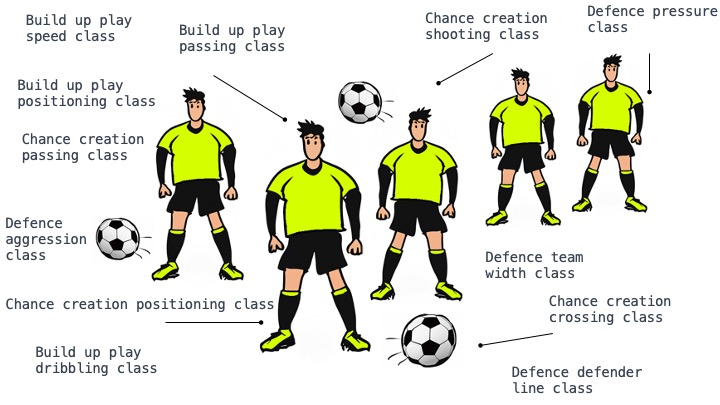

In [99]:
# Display all the columns
pd.set_option("display.max_columns", None)

with sqlite3.connect(football_db) as conn:
    cur = conn.cursor()
    df = pd.read_sql_query(f"SELECT * from 'Team_Attributes' LIMIT 5;", conn)
    display(df)

# Reset display of columns to default
pd.set_option("display.max_columns", 10)

,id,team_fifa_api_id,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,buildUpPlayPositioningClass,chanceCreationPassing,chanceCreationPassingClass,chanceCreationCrossing,chanceCreationCrossingClass,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,1,434,9930,2010-02-22 00:00:00,60,Balanced,NaN,Little,50,Mixed,Organised,60,Normal,65,Normal,55,Normal,Organised,50,Medium,55,Press,45,Normal,Cover
1,2,434,9930,2014-09-19 00:00:00,52,Balanced,48.0,Normal,56,Mixed,Organised,54,Normal,63,Normal,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
2,3,434,9930,2015-09-10 00:00:00,47,Balanced,41.0,Normal,54,Mixed,Organised,54,Normal,63,Normal,64,Normal,Organised,47,Medium,44,Press,54,Normal,Cover
3,4,77,8485,2010-02-22 00:00:00,70,Fast,NaN,Little,70,Long,Organised,70,Risky,70,Lots,70,Lots,Organised,60,Medium,70,Double,70,Wide,Cover
4,5,77,8485,2011-02-22 00:00:00,47,Balanced,NaN,Little,52,Mixed,Organised,53,Normal,48,Normal,52,Normal,Organised,47,Medium,47,Press,52,Normal,Cover


<IPython.core.display.Javascript object>

In [100]:
names_features(football_db, "Team_Attributes")

Names of features in Team_Attributes table are:

id, team_fifa_api_id, team_api_id, date, buildUpPlaySpeed, buildUpPlaySpeedClass, buildUpPlayDribbling, buildUpPlayDribblingClass, buildUpPlayPassing, buildUpPlayPassingClass, buildUpPlayPositioningClass, chanceCreationPassing, chanceCreationPassingClass, chanceCreationCrossing, chanceCreationCrossingClass, chanceCreationShooting, chanceCreationShootingClass, chanceCreationPositioningClass, defencePressure, defencePressureClass, defenceAggression, defenceAggressionClass, defenceTeamWidth, defenceTeamWidthClass, defenceDefenderLineClass.


<IPython.core.display.Javascript object>

In [101]:
pd.set_option("display.max_rows", None)
display(basic_table_analysis(football_db, "Team_Attributes"))
pd.set_option("display.max_rows", 15)

Total number of rows in Team_Attributes: 1458
Number of duplicate rows: 0


Total number of features in Team_Attributes: 25


,Feature name,Data type,Missing values (count),Missing values (%),Min value,Max value
id,id,int64,0,0.00,1.0,1458.0
team_fifa_api_id,team_fifa_api_id,int64,0,0.00,1.0,112513.0
team_api_id,team_api_id,int64,0,0.00,1601.0,274581.0
date,date,object,0,0.00,NaN,NaN
buildUpPlaySpeed,buildUpPlaySpeed,int64,0,0.00,20.0,80.0
buildUpPlaySpeedClass,buildUpPlaySpeedClass,object,0,0.00,NaN,NaN
buildUpPlayDribbling,buildUpPlayDribbling,float64,969,66.46,24.0,77.0
buildUpPlayDribblingClass,buildUpPlayDribblingClass,object,0,0.00,NaN,NaN
buildUpPlayPassing,buildUpPlayPassing,int64,0,0.00,20.0,80.0
buildUpPlayPassingClass,buildUpPlayPassingClass,object,0,0.00,NaN,NaN


<IPython.core.display.Javascript object>

### Build up play speed

This attribute represents the speed at which a team typically tries to advance the ball from their own half towards the opponent's goal. A higher value indicates a team that often attempts quick counter-attacks, rapidly pushing the ball forward when they gain possession. A lower value, on the other hand, would suggest a team that prefers to build their attacks more patiently, keeping possession and progressing gradually with short passes.

This attribute offers a categorical interpretation of the above, classifying the team's build-up play speed as either 'Slow', 'Balanced', or 'Fast'.

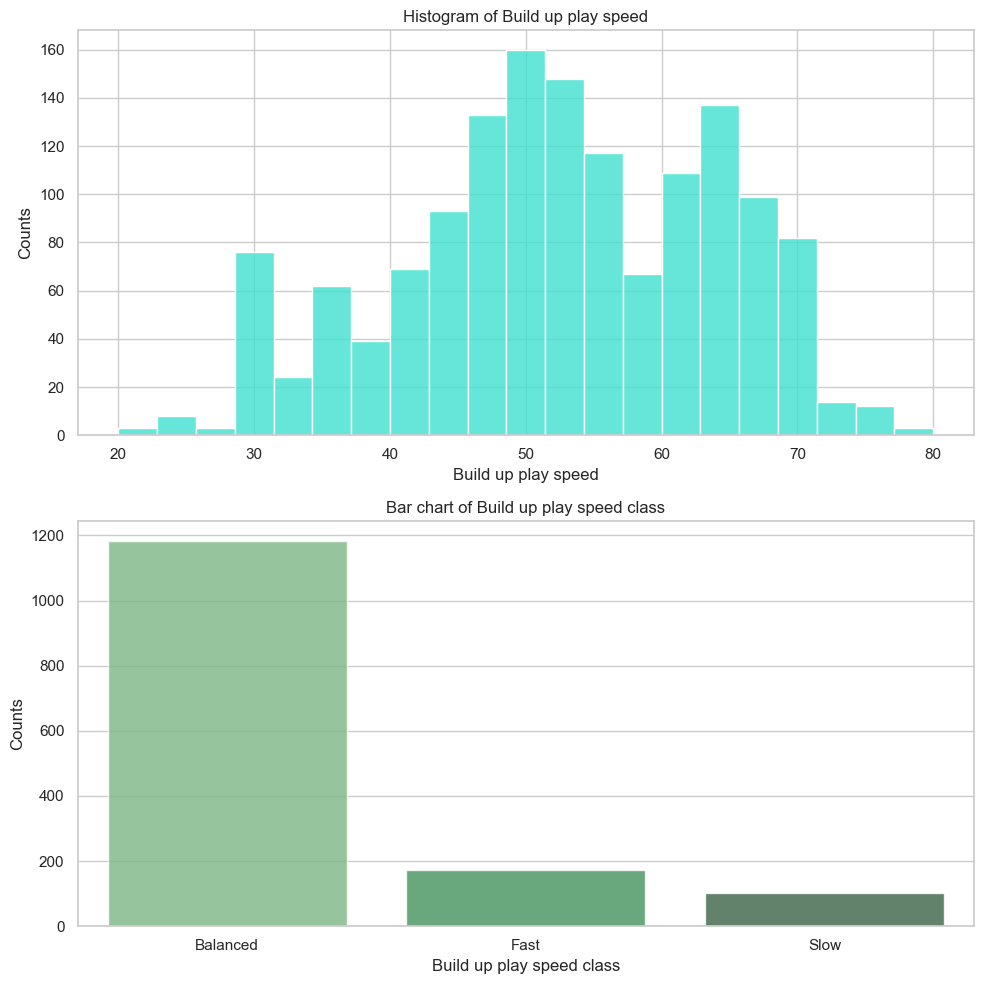

<IPython.core.display.Javascript object>

In [102]:
plot_teams_attr_both(
    football_db, "Team_Attributes", "buildUpPlaySpeed", "buildUpPlaySpeedClass"
)

### Build up play dribbling

This attribute measures a team's tendency to advance the ball through player dribbling as part of their attacking build-up. A team with a high value here would frequently try to beat opponents by having their players run with the ball, while a lower value suggests a style that relies less on dribbling and more on passing to advance the ball.

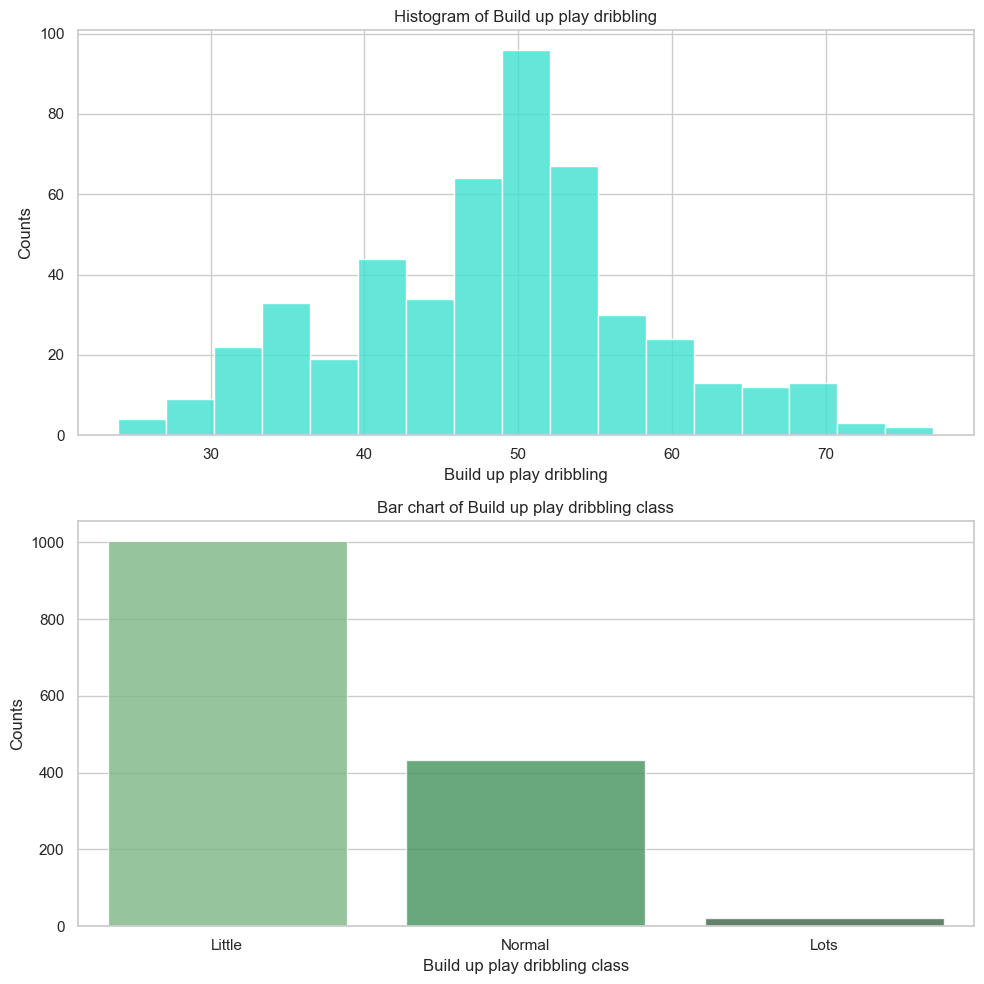

<IPython.core.display.Javascript object>

In [103]:
plot_teams_attr_both(
    football_db, "Team_Attributes", "buildUpPlayDribbling", "buildUpPlayDribblingClass"
)

### Build up play passing

This attribute gauges the length of the passes a team tends to use during their build-up play. A higher value suggests a team that often uses longer, more direct passes to try to quickly advance the ball, while a lower value indicates a preference for shorter passes, keeping the ball close and maintaining possession.

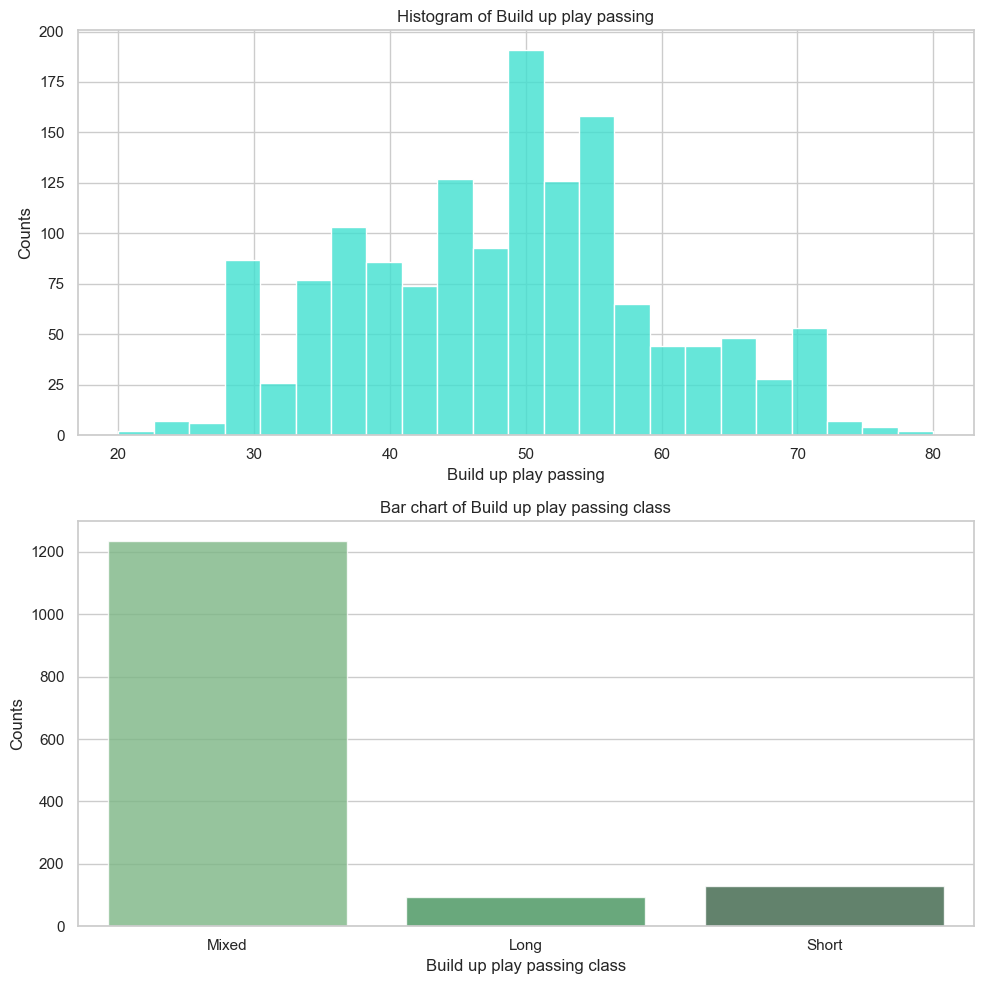

<IPython.core.display.Javascript object>

In [104]:
plot_teams_attr_both(
    football_db, "Team_Attributes", "buildUpPlayPassing", "buildUpPlayPassingClass"
)

### Build up play positioning

This attribute describes whether a team typically maintains a disciplined, structured formation ('Organised') during their build-up play, or if players have more freedom to move around and swap positions ('Free Form').

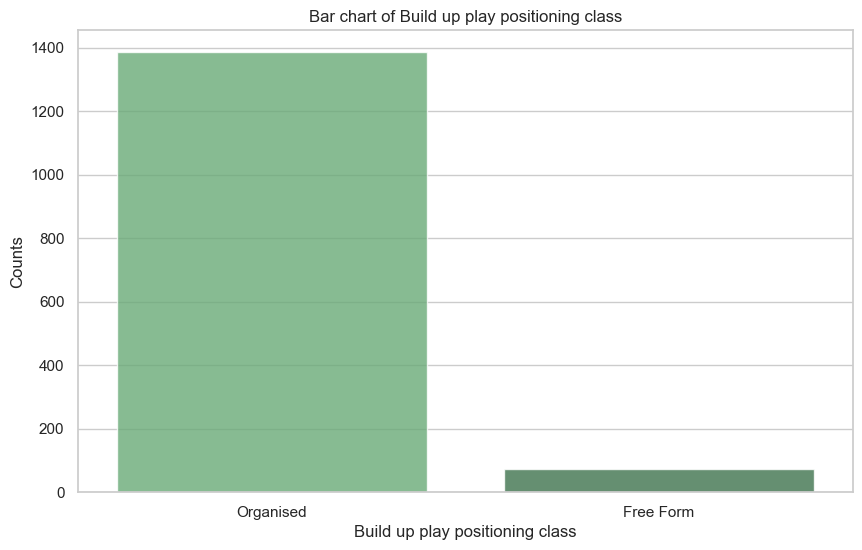

<IPython.core.display.Javascript object>

In [105]:
plot_teams_attr_bar(football_db, "Team_Attributes", "buildUpPlayPositioningClass")

### Chance creation passing

 This represents a team's willingness to take risks with passes when trying to create scoring chances. A high value suggests a team that frequently attempts difficult, risky passes in an effort to unlock the opponent's defence, while a lower value implies a safer, more conservative passing approach.

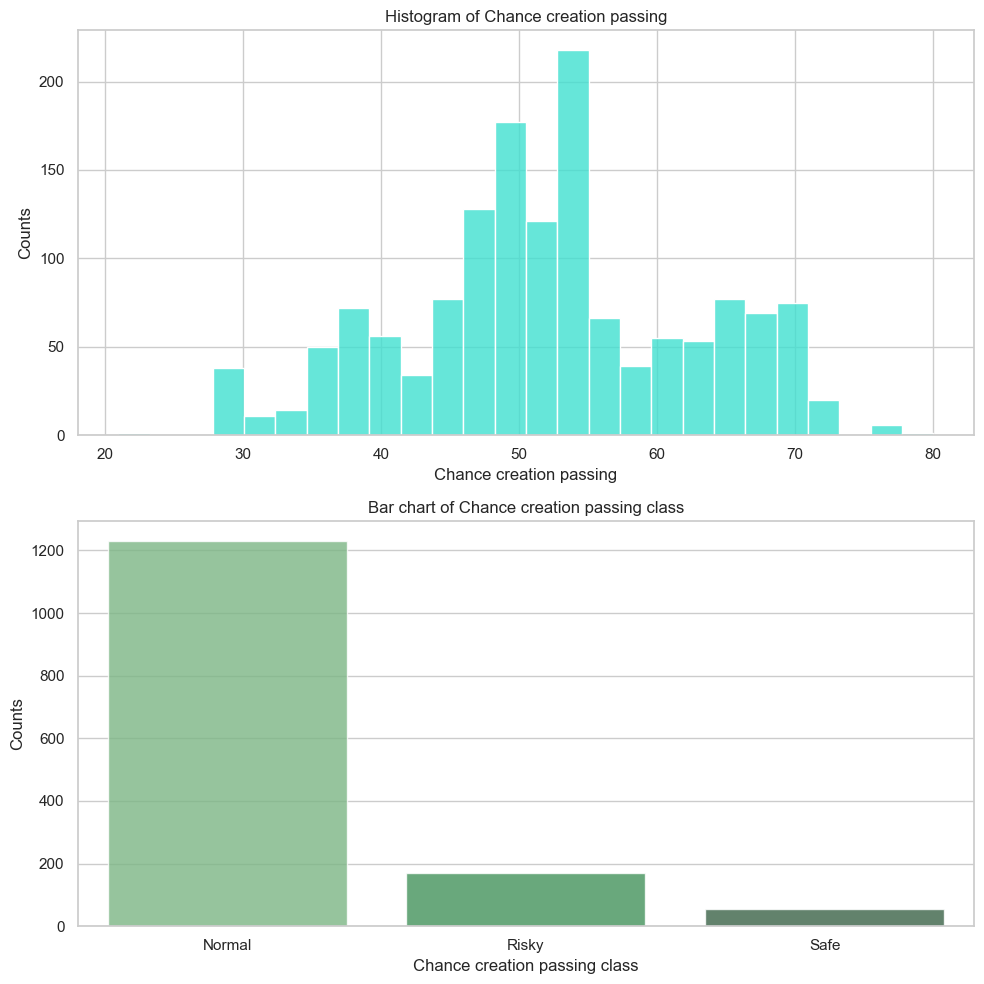

<IPython.core.display.Javascript object>

In [106]:
plot_teams_attr_both(
    football_db,
    "Team_Attributes",
    "chanceCreationPassing",
    "chanceCreationPassingClass",
)

### Chance creation crossing

This attribute measures a team's tendency to use crosses from the wings (long passes delivered into the penalty area) as a means of creating scoring opportunities. A higher value suggests a team that often tries to create chances from crosses, while a lower value indicates a team that typically creates chances in other ways.

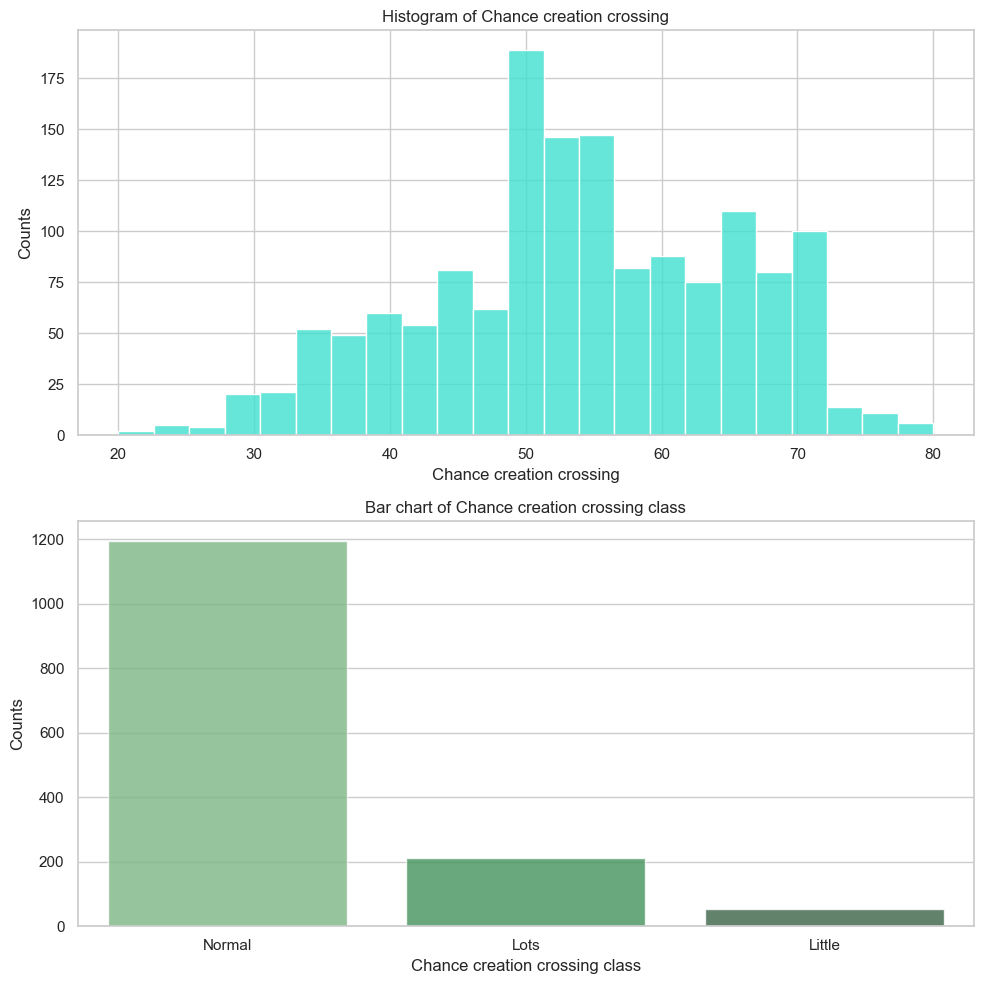

<IPython.core.display.Javascript object>

In [107]:
plot_teams_attr_both(
    football_db,
    "Team_Attributes",
    "chanceCreationCrossing",
    "chanceCreationCrossingClass",
)

### Chance creation shooting

This attribute indicates a team's inclination to take shots at goal. A higher value would suggest a team that frequently attempts shots from various positions, while a lower value would indicate a team that waits for more clear-cut opportunities before shooting.

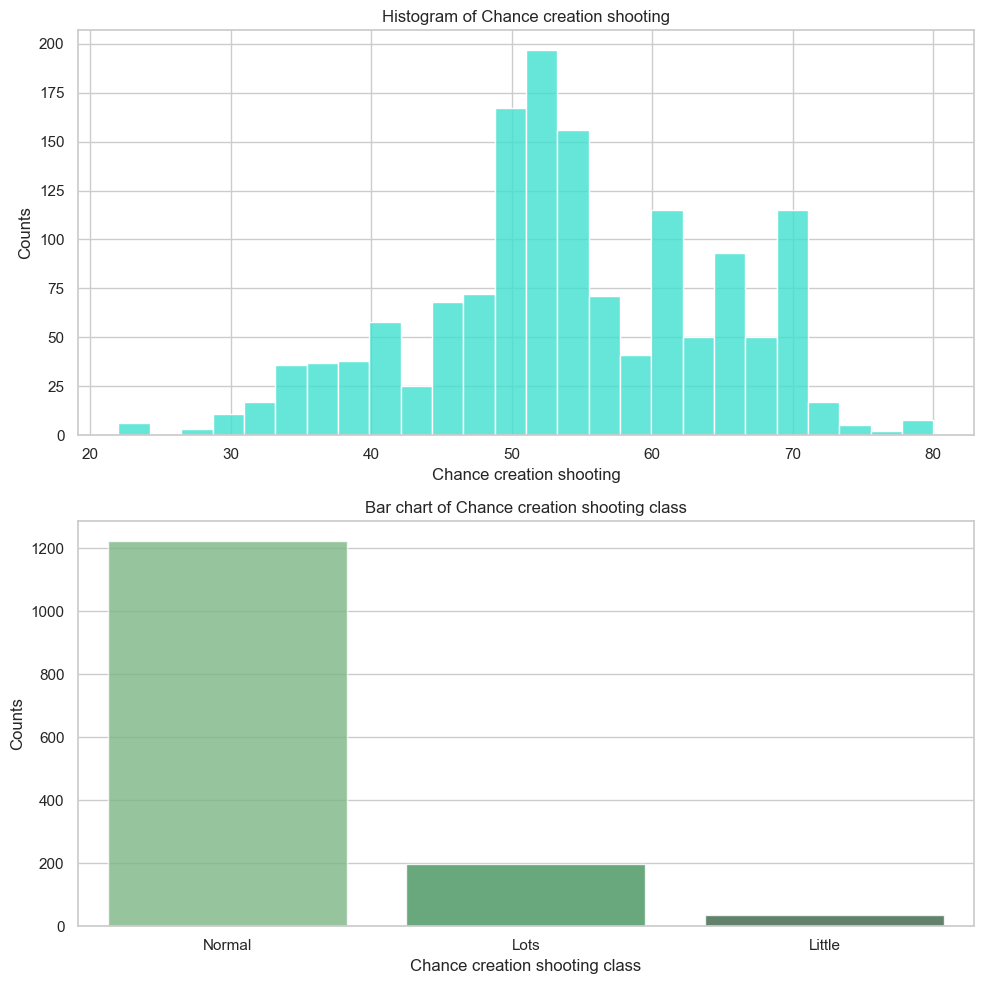

<IPython.core.display.Javascript object>

In [108]:
plot_teams_attr_both(
    football_db,
    "Team_Attributes",
    "chanceCreationShooting",
    "chanceCreationShootingClass",
)

### Chance creation positioning class

This describes whether a team maintains a structured formation ('Organised') when creating chances, or if players have more freedom to move around ('Free Form').

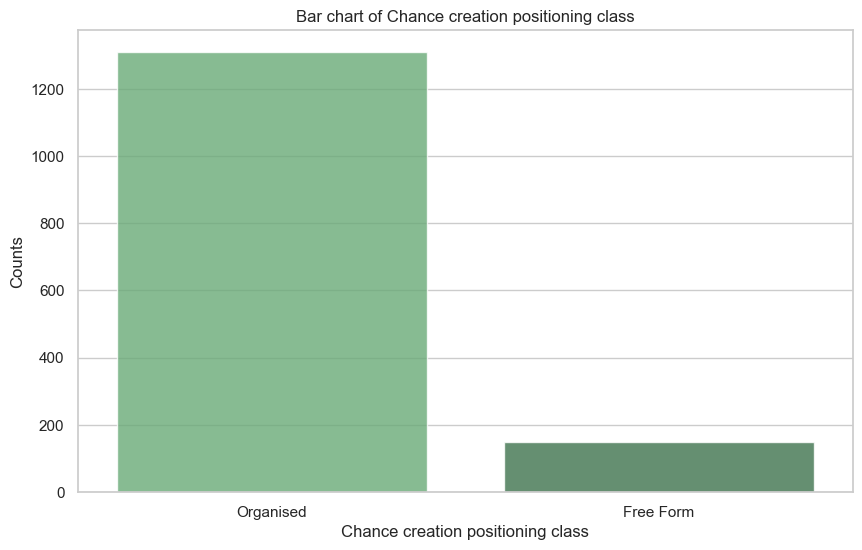

<IPython.core.display.Javascript object>

In [109]:
plot_teams_attr_bar(football_db, "Team_Attributes", "chanceCreationPositioningClass")

### Defence pressure

This attribute describes how high up the pitch the team starts to pressure the opposition to regain possession. A higher value suggests a high-pressing game, trying to win the ball back closer to the opponent's goal, while a lower value suggests a deeper defensive line that doesn't start pressing until closer to their own goal.

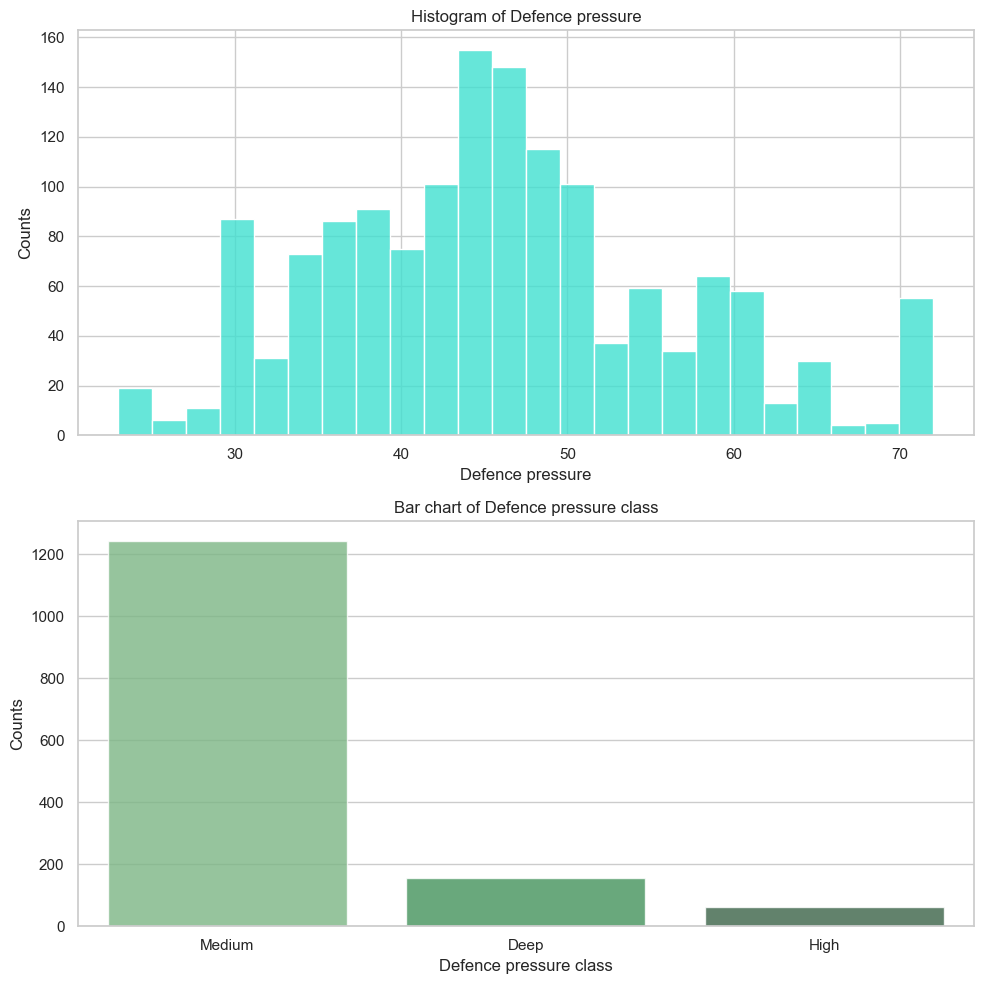

<IPython.core.display.Javascript object>

In [110]:
plot_teams_attr_both(
    football_db,
    "Team_Attributes",
    "defencePressure",
    "defencePressureClass",
)

### Defence aggression

This attribute represents the way in which a team approaches defending in terms of physicality and positioning. Higher values indicate a more aggressive defence, characterized by more challenges and attempts to regain possession. Lower values indicate a more passive, possibly zonal marking system where players are less likely to engage in physical challenges and more likely to keep their defensive shape.

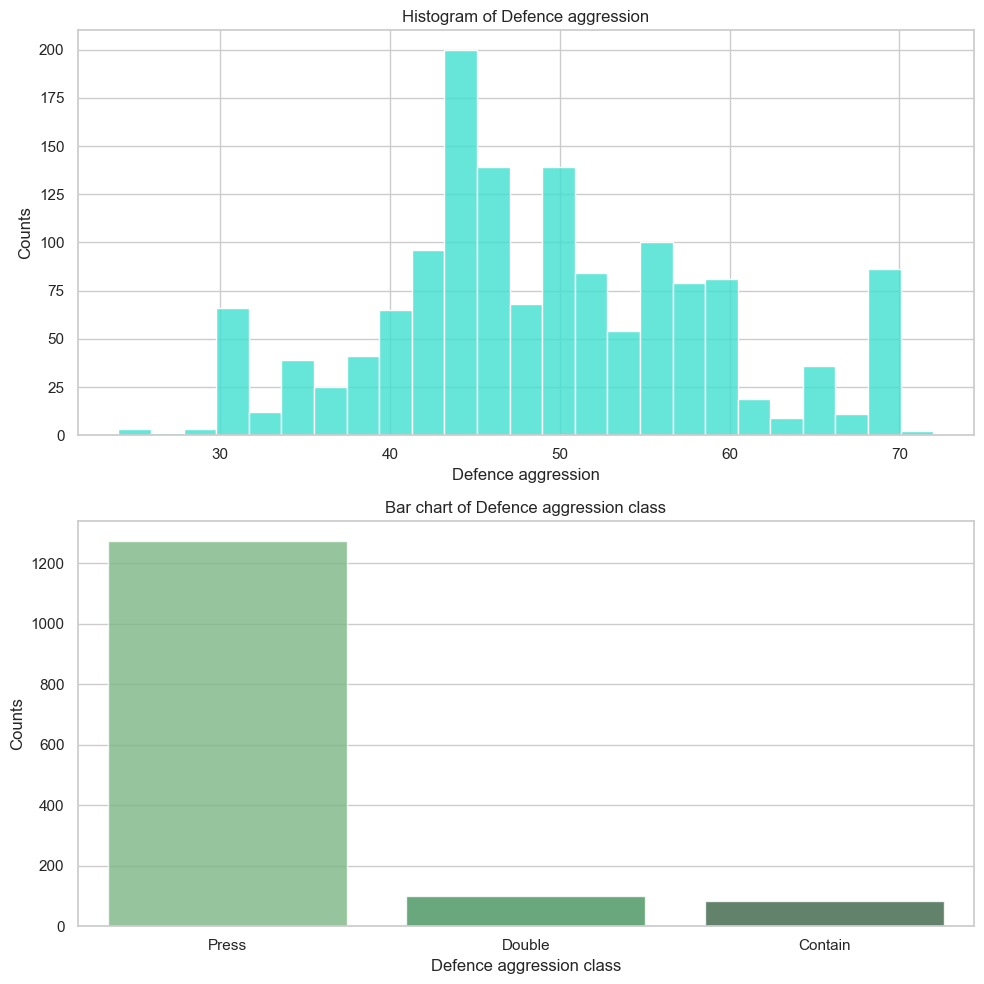

<IPython.core.display.Javascript object>

In [111]:
plot_teams_attr_both(
    football_db,
    "Team_Attributes",
    "defenceAggression",
    "defenceAggressionClass",
)

### Defence team width

This attribute describes how much width the team uses when in defence. A high value means the team tries to cover a larger horizontal area of the pitch, perhaps to guard against wide attacks. A lower value could indicate a more narrow defensive approach, focusing on the central areas of the pitch.

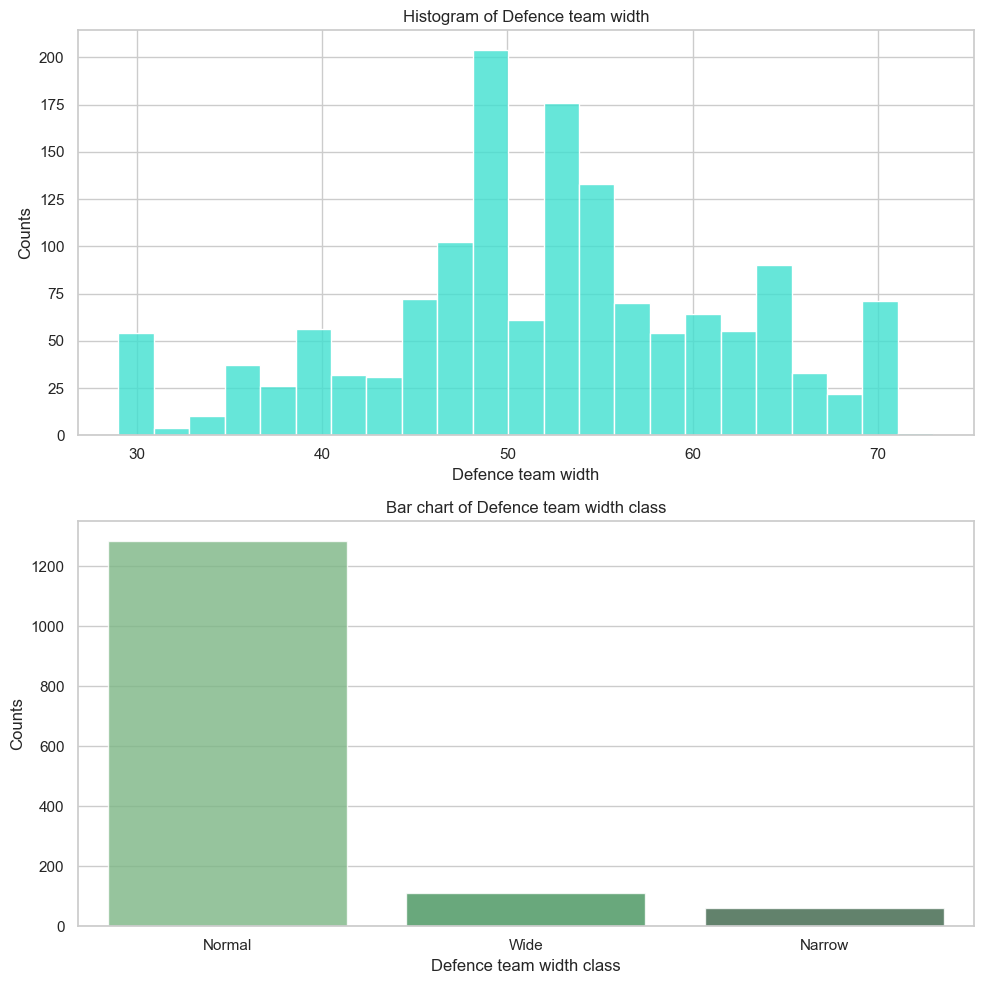

<IPython.core.display.Javascript object>

In [112]:
plot_teams_attr_both(
    football_db,
    "Team_Attributes",
    "defenceTeamWidth",
    "defenceTeamWidthClass",
)

### Defence defender line

This attribute represents the defensive strategy related to offside traps. It is categorical and its values are 'Offside Trap' or 'Cover'. 'Offside Trap' indicates a team that frequently attempts to catch the opposing attackers offside. 'Cover' means the team prefers to keep a deeper defensive line to cover spaces and defend against through balls.

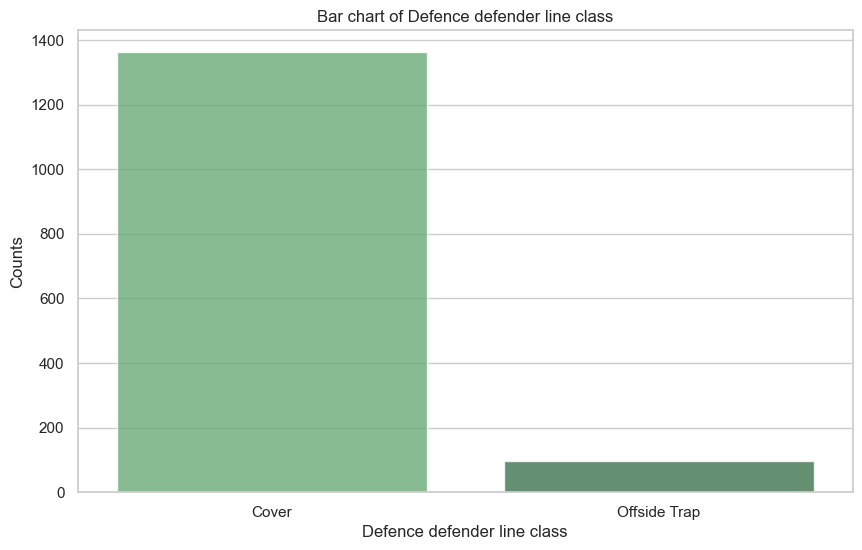

<IPython.core.display.Javascript object>

In [113]:
plot_teams_attr_bar(football_db, "Team_Attributes", "defenceDefenderLineClass")

## Correlation of numerical team attributes

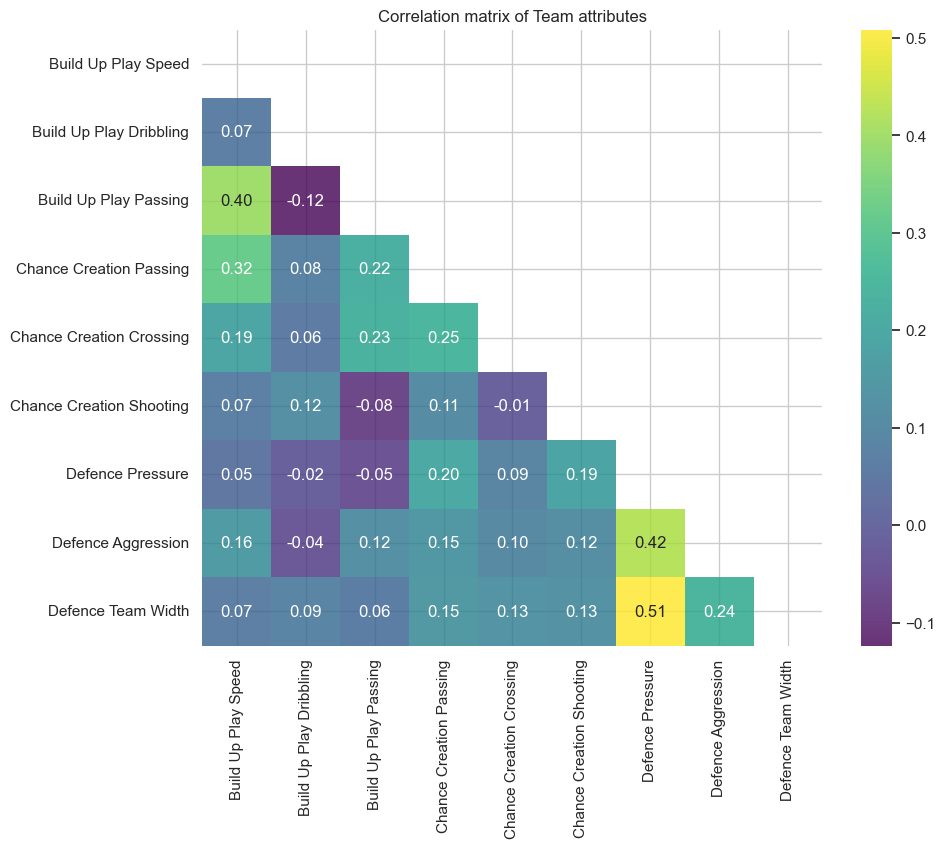

Pairs of features with high positive or negative correlation (above 0.5):
Defence Team Width and Defence Pressure


<IPython.core.display.Javascript object>

In [114]:
# Function to format column names
def split_before_caps(s):
    return ' '.join([''.join([w.capitalize() if i == 0 else w for i, w in enumerate(word.split('_'))]) for word in re.findall('[A-Z][a-z]*|[a-z]+|\d+', s)])

# Connect to the database
with sqlite3.connect(football_db) as conn:
    df = pd.read_sql_query("SELECT * FROM Team_Attributes", conn)

# Select only numericals
df = df.select_dtypes(include=np.number)

# Exclude id's, date already excluded due to categorical format
df = df.drop(columns=['id', 'team_fifa_api_id', 'team_api_id'])

# Rename the columns
df.columns = [split_before_caps(col) for col in df.columns]

# Calculate correlations
corr = df.corr()

# Mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
#plt.ylabel(rotation=45)
sns.heatmap(corr, mask=mask, cmap='viridis', alpha=0.8, annot=True, fmt=".2f")
plt.title('Correlation matrix of Team attributes')
plt.show()

# Unstack correlation matrix and sort
corr_unstacked = corr.unstack()
corr_sorted = corr_unstacked.sort_values(key=np.abs, ascending=False)

# Filter to correlations greater than 0.5 or less than -0.5 (excluding self-correlations of 1.0)
high_corr = corr_sorted[(np.abs(corr_sorted) > 0.5) & (corr_sorted != 1.0)]

# Get unique pairs and print
print('Pairs of features with high positive or negative correlation (above 0.5):')
seen = set()
for pair, correlation in high_corr.items():
    # Sort the pair to ensure (a, b) is considered the same as (b, a)
    sorted_pair = tuple(sorted(pair))
    if sorted_pair not in seen:
        print(f"{pair[0]} and {pair[1]}")
        seen.add(sorted_pair)


ML:
- buildUpPlaySpeed
- buildUpPlayDribbling
- chanceCreationPassing
- defencePressure
- defenceAggression

It seems that the wider the team formation, the more defense pressure it exerts.

# Predictions

In [115]:
# Linear regression for weather home team will win
conn = sqlite3.connect(football_db)

# consider only player performance that was known up to the date of the match
# WHERE player info date < match occurance date
home_query_player = """
    SELECT 
        M.id, M.home_team_goal,
        AVG(P.overall_rating) as overall_rating, 
        AVG(P.potential) as potential, 
        AVG(P.crossing) as crossing, 
        AVG(P.finishing) as finishing, 
        AVG(P.heading_accuracy) as heading_accuracy,
        AVG(P.short_passing) as short_passing, 
        AVG(P.volleys) as volleys, 
        AVG(P.dribbling) as dribbling, 
        AVG(P.curve) as curve,
        AVG(P.free_kick_accuracy) as free_kick_accuracy
    FROM 
        Match AS M
    JOIN 
        Player_Attributes AS P
    ON 
        M.home_player_1 = P.player_api_id OR 
        M.home_player_2 = P.player_api_id OR
        M.home_player_3 = P.player_api_id OR
        M.home_player_4 = P.player_api_id OR
        M.home_player_5 = P.player_api_id OR
        M.home_player_6 = P.player_api_id OR
        M.home_player_7 = P.player_api_id OR
        M.home_player_8 = P.player_api_id OR
        M.home_player_9 = P.player_api_id OR
        M.home_player_10 = P.player_api_id OR
        M.home_player_11 = P.player_api_id
    WHERE 
        P.date < M.date
    GROUP BY 
        M.id
"""
home_player_data = pd.read_sql_query(home_query_player, conn)

home_query_team = """
    SELECT 
        M.id,
        AVG(T.buildUpPlaySpeed) as buildUpPlaySpeed,
        AVG(T.buildUpPlayDribbling) as buildUpPlayDribbling,
        AVG(T.buildUpPlayPassing) as buildUpPlayPassing
    FROM 
        Match AS M
    JOIN 
        Team_Attributes AS T
    ON 
        M.home_team_api_id = T.team_api_id
    WHERE 
        T.date < M.date
    GROUP BY 
        M.id
"""
home_team_data = pd.read_sql_query(home_query_team, conn)
home_data = pd.merge(home_player_data, home_team_data, on="id")

X_home = home_data.drop(columns=["id", "home_team_goal"])
y_home = home_data["home_team_goal"]

# Split data
X_train_home, X_test_home, y_train_home, y_test_home = train_test_split(
    X_home, y_home, test_size=0.2, random_state=42
)

# Fill missing data with mean (imputation module)
imputer = SimpleImputer(strategy="mean")
X_train_home = imputer.fit_transform(X_train_home)
X_test_home = imputer.transform(X_test_home)

# Scale (standart: miu=0, sigma=1)
scaler = StandardScaler()
X_train_home = scaler.fit_transform(X_train_home)
X_test_home = scaler.transform(X_test_home)

# Model
model_home = LinearRegression()
model_home.fit(X_train_home, y_train_home)

y_pred_home = model_home.predict(X_test_home)

# Print results
print("Model performance when predicting Home win:")
# print('mean_absolute_error:', mean_absolute_error(y_test_home, y_pred_home))
# print('mean_squared_error:', mean_squared_error(y_test_home, y_pred_home))
print("R^2 Score:", r2_score(y_test_home, y_pred_home))

Model performance when predicting Home win:
R^2 Score: 0.04975437880717959


<IPython.core.display.Javascript object>

In [116]:
# Linear regression for weather away team will win

conn = sqlite3.connect(football_db)

# consider only player performance that was known up to the date of the match
# WHERE player info date < match occurance date
away_query_player = """
    SELECT 
        M.id, M.away_team_goal,
        AVG(P.overall_rating) as overall_rating, 
        AVG(P.potential) as potential, 
        AVG(P.crossing) as crossing, 
        AVG(P.finishing) as finishing, 
        AVG(P.heading_accuracy) as heading_accuracy,
        AVG(P.short_passing) as short_passing, 
        AVG(P.volleys) as volleys, 
        AVG(P.dribbling) as dribbling, 
        AVG(P.curve) as curve,
        AVG(P.free_kick_accuracy) as free_kick_accuracy
    FROM 
        Match AS M
    JOIN 
        Player_Attributes AS P
    ON 
        M.away_player_1 = P.player_api_id OR 
        M.away_player_2 = P.player_api_id OR
        M.away_player_3 = P.player_api_id OR
        M.away_player_4 = P.player_api_id OR
        M.away_player_5 = P.player_api_id OR
        M.away_player_6 = P.player_api_id OR
        M.away_player_7 = P.player_api_id OR
        M.away_player_8 = P.player_api_id OR
        M.away_player_9 = P.player_api_id OR
        M.away_player_10 = P.player_api_id OR
        M.away_player_11 = P.player_api_id
    WHERE 
        P.date < M.date
    GROUP BY 
        M.id
"""
away_player_data = pd.read_sql_query(away_query_player, conn)

away_query_team = """
    SELECT 
        M.id,
        AVG(T.buildUpPlaySpeed) as buildUpPlaySpeed,
        AVG(T.buildUpPlayDribbling) as buildUpPlayDribbling,
        AVG(T.buildUpPlayPassing) as buildUpPlayPassing
    FROM 
        Match AS M
    JOIN 
        Team_Attributes AS T
    ON 
        M.away_team_api_id = T.team_api_id
    WHERE 
        T.date < M.date
    GROUP BY 
        M.id
"""
away_team_data = pd.read_sql_query(away_query_team, conn)
away_data = pd.merge(away_player_data, away_team_data, on="id")

X_away = away_data.drop(columns=["id", "away_team_goal"])
y_away = away_data["away_team_goal"]

# Split data
X_train_away, X_test_away, y_train_away, y_test_away = train_test_split(
    X_away, y_away, test_size=0.2, random_state=42
)

# Fill missing data with mean (imputation module)
X_train_away = imputer.fit_transform(X_train_away)
X_test_away = imputer.transform(X_test_away)

# Scale (standart: miu=0, sigma=1)
X_train_away = scaler.fit_transform(X_train_away)
X_test_away = scaler.transform(X_test_away)

# Model
model_away = LinearRegression()
model_away.fit(X_train_away, y_train_away)
y_pred_away = model_away.predict(X_test_away)

# Print out the metrics
print("Model performance when predicting Away team's win:")
print("R^2 Score:", r2_score(y_test_away, y_pred_away))

Model performance when predicting Away team's win:
R^2 Score: 0.030228813453129666


<IPython.core.display.Javascript object>

Linear prediction models are either not good at predicting the exact outcome of the match or more features are necessary to take into account when building such models. In this case, 10 selected features (free_kick_accuracy was correlated with another feature not included) from player attributes and 4 from teams attributes were used. R^2 value is less than 0.05, which is low, but home wins seems to be a little easier to predict. It could be related to the home advantage observed.

In [117]:
conn = sqlite3.connect(football_db)

# Query for home team
home_query = """
    SELECT 
        M.id,
        M.home_team_goal, M.away_team_goal,
        AVG(P.reactions) as reactions, 
        AVG(P.vision) as vision, 
        AVG(P.short_passing) as short_passing, 
        AVG(P.long_passing) as long_passing, 
        AVG(P.ball_control) as ball_control,
        AVG(T.buildUpPlaySpeed) as buildUpPlaySpeed,
        AVG(T.buildUpPlayDribbling) as buildUpPlayDribbling,
        AVG(T.buildUpPlayPassing) as buildUpPlayPassing,
        AVG(T.defencePressure) as defencePressure
    FROM 
        Match AS M
    JOIN 
        Player_Attributes AS P ON 
        M.home_player_1 = P.player_api_id OR 
        M.home_player_2 = P.player_api_id OR
        M.home_player_3 = P.player_api_id OR
        M.home_player_4 = P.player_api_id OR
        M.home_player_5 = P.player_api_id OR
        M.home_player_6 = P.player_api_id OR
        M.home_player_7 = P.player_api_id OR
        M.home_player_8 = P.player_api_id OR
        M.home_player_9 = P.player_api_id OR
        M.home_player_10 = P.player_api_id OR
        M.home_player_11 = P.player_api_id
    JOIN 
        Team_Attributes AS T ON M.home_team_api_id = T.team_api_id
    WHERE 
        P.date < M.date AND T.date < M.date
    GROUP BY 
        M.id
"""

data = pd.read_sql_query(home_query, conn)

# home win (1); away team win (-1), draw (2)
data["outcome"] = data.apply(
    lambda row: 1
    if row["home_team_goal"] > row["away_team_goal"]
    else (-1 if row["home_team_goal"] < row["away_team_goal"] else 2),
    axis=1,
)

X = data.drop(columns=["id", "home_team_goal", "away_team_goal", "outcome"])
y = data["outcome"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Missing fill as mean
imputer = SimpleImputer(strategy="mean")
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Standart scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Model
model = LogisticRegression(multi_class="ovr", solver="liblinear")
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Print performance metrics, add zero division exception to control /0 behaviour
# (why happens?)
print("Model Performance:")
print(classification_report(y_test, y_pred, zero_division=0))

Model Performance:
              precision    recall  f1-score   support

          -1       0.32      0.18      0.23      1107
           1       0.48      0.88      0.62      1834
           2       0.00      0.00      0.00      1042

    accuracy                           0.45      3983
   macro avg       0.27      0.35      0.28      3983
weighted avg       0.31      0.45      0.35      3983



<IPython.core.display.Javascript object>

In [118]:
# Take a look at the data after preparation, but before NaN removal
data

,id,home_team_goal,away_team_goal,reactions,vision,...,buildUpPlaySpeed,buildUpPlayDribbling,buildUpPlayPassing,defencePressure,outcome
0,414,1,0,63.629630,66.740741,...,45.000000,NaN,35.000000,65.000000,1
1,421,4,1,59.878049,57.333333,...,40.000000,NaN,50.000000,70.000000,1
2,424,1,1,58.978261,57.666667,...,65.000000,NaN,60.000000,65.000000,2
3,434,0,2,60.189189,57.972973,...,40.000000,NaN,50.000000,70.000000,-1
4,435,4,0,63.627451,68.862745,...,45.000000,NaN,35.000000,65.000000,1
...,...,...,...,...,...,...,...,...,...,...,...
19908,25974,3,0,64.048780,57.800000,...,54.333333,57.0,44.000000,42.666667,1
19909,25975,1,0,58.858065,48.309677,...,47.600000,46.0,51.800000,43.800000,1
19910,25976,1,2,59.798611,52.236111,...,53.000000,32.0,56.000000,42.000000,-1
19911,25977,2,0,62.180905,57.080402,...,49.500000,60.0,53.166667,37.833333,1


<IPython.core.display.Javascript object>

In [121]:
# Check for unique outcomes
outcome_unique = data["outcome"].value_counts()
print(outcome_unique)

 1    9149
-1    5716
 2    5048
Name: outcome, dtype: int64


<IPython.core.display.Javascript object>

Logistic regression model is better at predicting home wins, a bit worse at predicting away wins and fails to predict draws (for unspecified reasons). Overall this approach to modelling seems to be good, as here only 5 features of player attributes and 4 features of teams attributes are used. Computation time is around 30 min. Adding more features into consideration could benefit the model, however increased compute power is necessary.

# Conclusions

As a new business, we are a lot more familiar with the football metrics than we were before this report. Answers to the questions we initially had has been answered and all the metrics presented in the dataset were clarified. The prediction model implemented still lacks accuracy. There are few reasons for that. Such as: it is in general very hard to predict particular outcome as too many factors are into play at each game; simple linear models may never reach acceptably good accuracy; and the computation power of a single home user is insufficient to significantly improve predictions.

As the data is now fully analyzed, for predictions I suggest the business team to do the following tasks:
- Create a new dataset from the merged relevant attributes;
- Move prediction computations to the cloud, such as AWS;
- Incorporate prediction values of other companies such as Bet365, as features of those companies are highly positively correlated, dimensionality reduction may be used to reduce the complexity of training.

# Google Looker Studio report

Report can be accessed at https://lookerstudio.google.com/s/jVdIRoNCzSE

This report is the overview of the dataset for business people. Data was extracted from database throughout the notebook analysis.

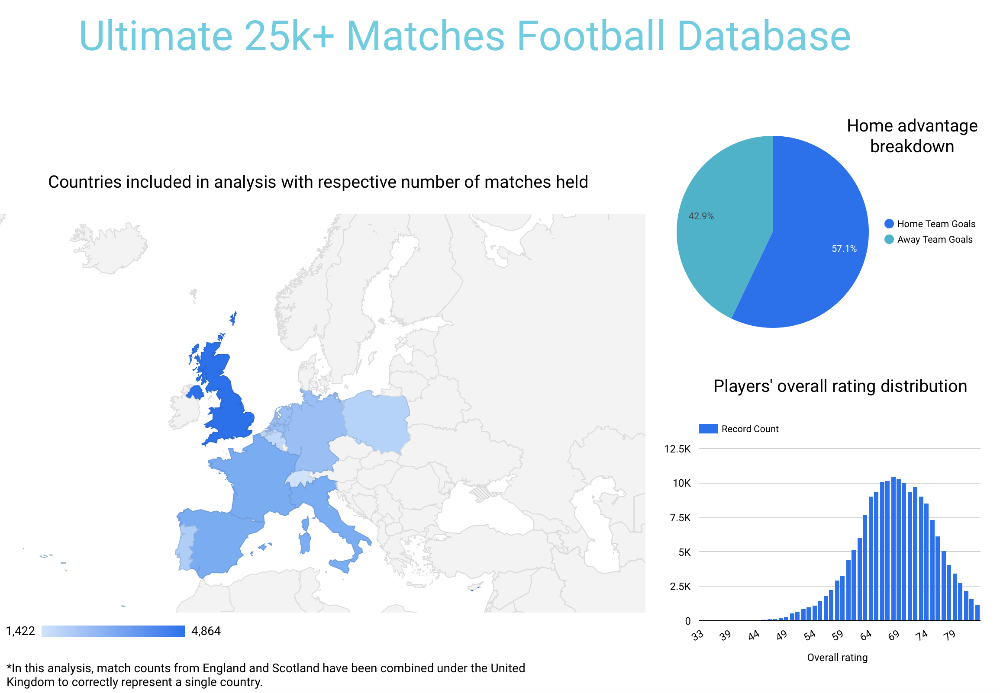